<a href="https://colab.research.google.com/github/dynji/Training/blob/main/Netflix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


###Data1

In [ ]:
import pandas as pd
data1= pd.read_csv('/content/gdrive/MyDrive/Netflix/Netflix Userbase.csv')
data1.head()

,User ID,Subscription Type,Monthly Revenue,Join Date,Last Payment Date,Country,Age,Gender,Device,Plan Duration
0,1,Basic,10,15-01-22,10-06-23,United States,28,Male,Smartphone,1 Month
1,2,Premium,15,05-09-21,22-06-23,Canada,35,Female,Tablet,1 Month
2,3,Standard,12,28-02-23,27-06-23,United Kingdom,42,Male,Smart TV,1 Month
3,4,Standard,12,10-07-22,26-06-23,Australia,51,Female,Laptop,1 Month
4,5,Basic,10,01-05-23,28-06-23,Germany,33,Male,Smartphone,1 Month


In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   User ID            2500 non-null   int64 
 1   Subscription Type  2500 non-null   object
 2   Monthly Revenue    2500 non-null   int64 
 3   Join Date          2500 non-null   object
 4   Last Payment Date  2500 non-null   object
 5   Country            2500 non-null   object
 6   Age                2500 non-null   int64 
 7   Gender             2500 non-null   object
 8   Device             2500 non-null   object
 9   Plan Duration      2500 non-null   object
dtypes: int64(3), object(7)
memory usage: 195.4+ KB


In [ ]:
data1['Country'].unique()

array(['United States', 'Canada', 'United Kingdom', 'Australia',
       'Germany', 'France', 'Brazil', 'Mexico', 'Spain', 'Italy'],
      dtype=object)

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

In [ ]:
#categorical_cols = ['Subscription Type', 'Country', 'Gender', 'Device', 'Plan Duration']

#encoded_mapping = {}

#for col in categorical_cols:
#    label_encoder = LabelEncoder()
#    encoded_values = data1[col].unique()
#    label_encoder.fit(encoded_values)
#    data1[col] = label_encoder.transform(data1[col])
#    encoded_mapping[col] = dict(zip(label_encoder.transform(encoded_values), encoded_values))

# Print the mapping
#for col, mapping in encoded_mapping.items():
#    print(f"{col} Mapping:")
#   print(mapping)

In [ ]:
# import  plotly.express as px
# country_data  = data1.groupby('Country').agg({'User ID':'count', 'Monthly Revenue':'sum'}).reset_index()
# fig1= px.choropleth(country_data, locations='Country', locationmode='country names', color='User ID', title ='Number of Netlix Users by Country', hover_name ='Country', color_continuous_scale='Plasma')
# fig1.show()
# fig2 = px.choropleth(country_data, locations = 'Country', locationmode = 'country names', color= 'Monthly Revenue', title='Total Netflix Revenue by Country', hover_name = 'Country', color_continuous_scale='Plasma')
# fig2.show()

Age, Gender, Country

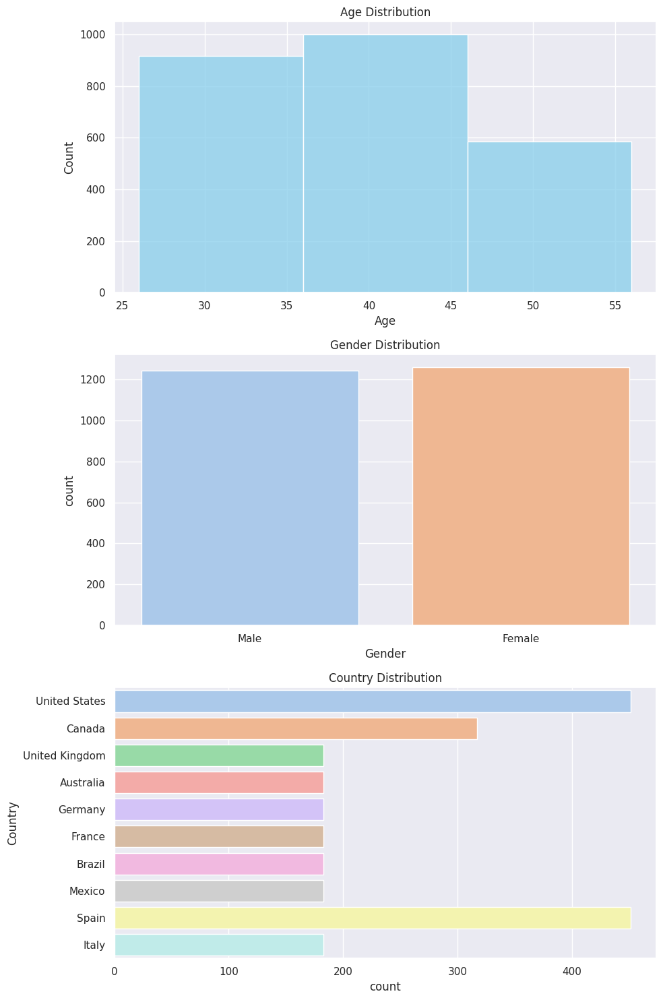

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme()
fig, axes = plt.subplots(3, 1, figsize=(10, 15))

# Plot the age distribution
sns.histplot(data=data1, x="Age", binwidth=10, color='skyblue', ax=axes[0])
axes[0].set_title('Age Distribution')

# Plot the gender distribution
sns.countplot(data=data1, x="Gender", palette='pastel', ax=axes[1])
axes[1].set_title('Gender Distribution')

# Plot the country distribution
sns.countplot(y="Country", data=data1, palette='pastel', ax=axes[2])
axes[2].set_title('Country Distribution')

# Adjust the layout
plt.tight_layout()
plt.show()

In [ ]:
from geopy.geocoders import Nominatim

In [ ]:
geolocator = Nominatim(user_agent="netflix_user_map_2")

In [ ]:
batch_size =10
coordinate_cache= {}

In [ ]:
def get_batch_coordinates(country_batch):
    coordinates = []
    for country in country_batch:
        if country in coordinate_cache:
            coordinates.append(coordinate_cache[country])
        else:
            location = geolocator.geocode(country)
            if location:
                coordinate = (location.latitude, location.longitude)
                coordinate_cache[country] = coordinate
                coordinates.append(coordinate)
            else:
                coordinates.append((None, None))
    return coordinates

In [ ]:
coordinates = []
for i in range(0, len(data1), batch_size):
    batch = data1['Country'][i:i + batch_size]
    batch_coordinates = get_batch_coordinates(batch)
    coordinates.extend(batch_coordinates)

In [ ]:
data1['Latitude'], data1['Longitude'] = zip(*coordinates)

In [ ]:
import folium
from folium.plugins import MarkerCluster

In [ ]:
m = folium.Map(location=[data1['Latitude'].mean(), data1['Longitude'].mean()], zoom_start=2)
marker_cluster = MarkerCluster().add_to(m)

for index, row in data1.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['User ID']).add_to(marker_cluster)

In [ ]:
display(m)

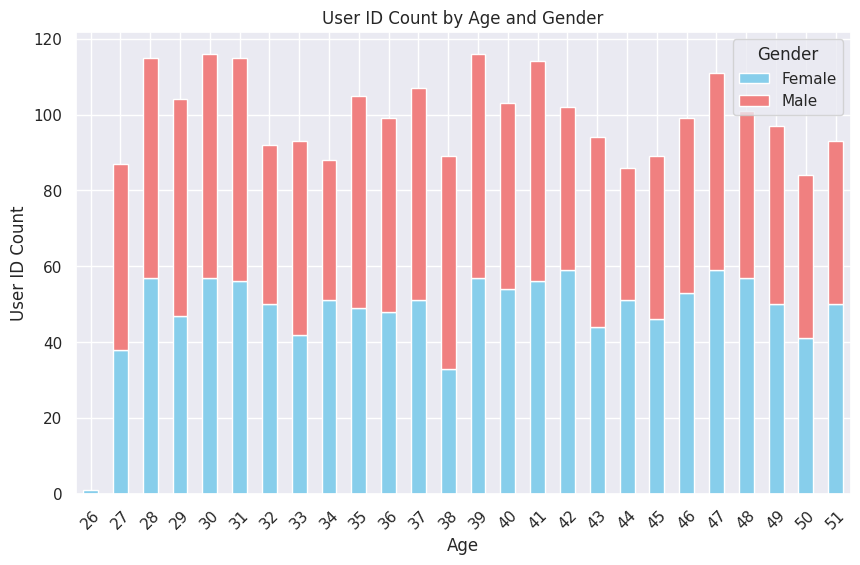

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme()
fig, ax = plt.subplots(figsize=(10, 6))

age_gender_counts = data1.groupby(['Age', 'Gender'])['User ID'].count().unstack()

age_gender_counts.plot(kind='bar', stacked=True, ax=ax, color=['skyblue', 'lightcoral'])
ax.set_title('User ID Count by Age and Gender')
ax.set_xlabel('Age')
ax.set_ylabel('User ID Count')
plt.xticks(rotation=45)

plt.show()


In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   User ID            2500 non-null   int64  
 1   Subscription Type  2500 non-null   object 
 2   Monthly Revenue    2500 non-null   int64  
 3   Join Date          2500 non-null   object 
 4   Last Payment Date  2500 non-null   object 
 5   Country            2500 non-null   object 
 6   Age                2500 non-null   int64  
 7   Gender             2500 non-null   object 
 8   Device             2500 non-null   object 
 9   Plan Duration      2500 non-null   object 
 10  Latitude           2500 non-null   float64
 11  Longitude          2500 non-null   float64
dtypes: float64(2), int64(3), object(7)
memory usage: 234.5+ KB


In [ ]:
data1['Age'].describe()

count    2500.000000
mean       38.795600
std         7.171778
min        26.000000
25%        32.000000
50%        39.000000
75%        45.000000
max        51.000000
Name: Age, dtype: float64

In [ ]:
# Tạo bảng tham chiếu quốc gia và châu lục
country_to_continent = {
    'United States': 'The Americas',
    'Canada': 'The Americas',
    'United Kingdom': 'Europe',
    'Australia': 'Oceania',
    'Germany': 'Europe',
    'France': 'Europe',
    'Brazil': 'The Americas',
    'Mexico': 'The Americas',
    'Spain': 'Europe',
    'Italy': 'Europe',
}


In [ ]:
# Tạo cột "continent" bằng cách ánh xạ từ "country" sử dụng bảng tham chiếu
data1['continent'] = data1['Country'].map(country_to_continent)


In [ ]:
# Đếm số lượng khách hàng (User ID) theo châu lục
continent_user_counts = data1.groupby('continent')['User ID'].count()

# In kết quả
print(continent_user_counts)


continent
Europe          1183
Oceania          183
The Americas    1134
Name: User ID, dtype: int64


In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   User ID            2500 non-null   int64  
 1   Subscription Type  2500 non-null   object 
 2   Monthly Revenue    2500 non-null   int64  
 3   Join Date          2500 non-null   object 
 4   Last Payment Date  2500 non-null   object 
 5   Country            2500 non-null   object 
 6   Age                2500 non-null   int64  
 7   Gender             2500 non-null   object 
 8   Device             2500 non-null   object 
 9   Plan Duration      2500 non-null   object 
 10  Latitude           2500 non-null   float64
 11  Longitude          2500 non-null   float64
 12  continent          2500 non-null   object 
dtypes: float64(2), int64(3), object(8)
memory usage: 254.0+ KB


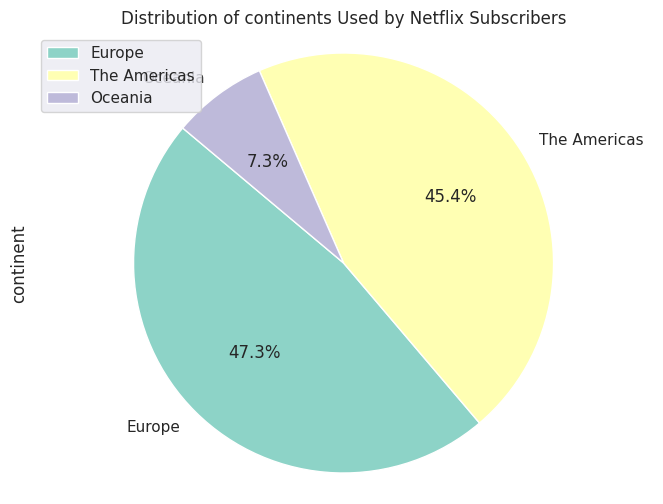

In [ ]:
continents_counts = data1['continent'].value_counts()
plt.figure(figsize=(8, 6))
continents_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140, colors=plt.cm.Set3.colors)
plt.title('Distribution of continents Used by Netflix Subscribers')
plt.axis('equal')
plt.legend(continents_counts.index, loc='best')
plt.show()

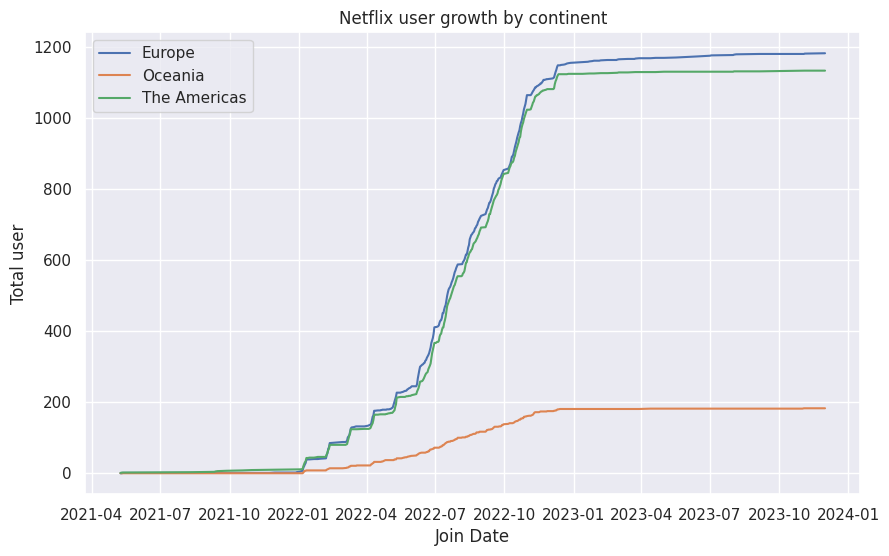

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Chuyển cột "Join Date" sang kiểu datetime (nếu chưa được chuyển)
data1['Join Date'] = pd.to_datetime(data1['Join Date'])

# Tính số lượng người dùng mới theo ngày tham gia và châu lục
daily_new_users = data1.groupby(['Join Date', 'continent']).size().unstack().fillna(0).cumsum()

# Vẽ biểu đồ sự tăng trưởng
plt.figure(figsize=(10, 6))
for continent in daily_new_users.columns:
    plt.plot(daily_new_users.index, daily_new_users[continent], label=continent)

plt.xlabel('Join Date')
plt.ylabel('Total user')
plt.title('Netflix user growth by continent')
plt.legend()
plt.show()


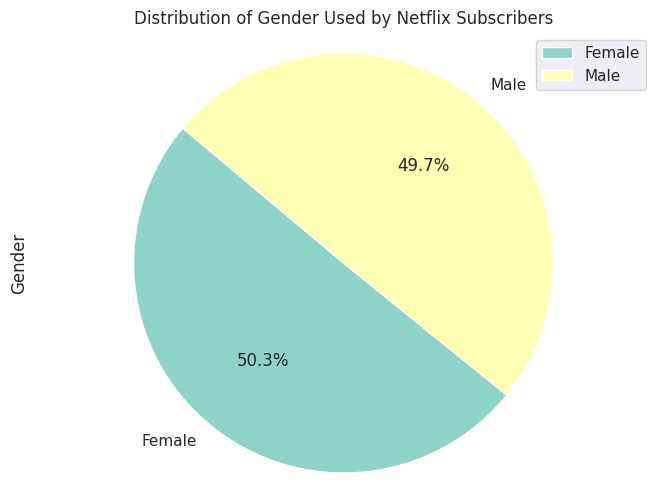

In [ ]:
gender_counts = data1['Gender'].value_counts()
plt.figure(figsize=(8, 6))
gender_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140, colors=plt.cm.Set3.colors)
plt.title('Distribution of Gender Used by Netflix Subscribers')
plt.axis('equal')
plt.legend(gender_counts.index, loc='best')
plt.show()

In [ ]:
import plotly.express as px
subscription_counts = data1.groupby(['Country', 'Subscription Type'])['User ID'].count().reset_index()
fig = px.bar(subscription_counts, x='Country', y='User ID', color='Subscription Type',
             title='Subscription Plan Counts by Country', labels={'User ID': 'Number of Subscriptions'})

fig.update_xaxes(categoryorder='total ascending')
fig.update_layout(xaxis_title='Country', yaxis_title='Number of Subscriptions')
fig.update_layout(xaxis_tickangle=-45)
fig.update_layout(width=9*100 , height=5*100)
fig.show()


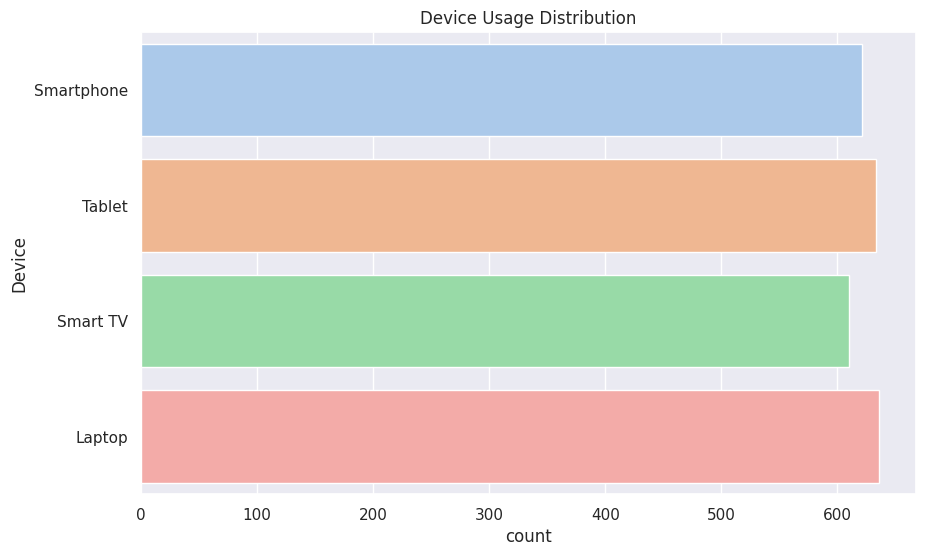

In [ ]:
# Create a figure for the plot
plt.figure(figsize=(10, 6))

# Plot the device usage distribution
sns.countplot(y="Device", data=data1, palette='pastel')
plt.title('Device Usage Distribution')

# Show the plot
plt.show()

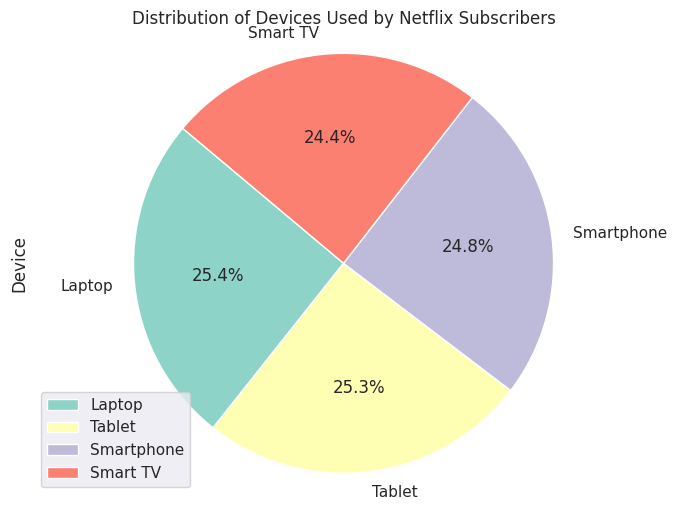

In [ ]:
device_counts = data1['Device'].value_counts()

plt.figure(figsize=(8, 6))
device_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140, colors=plt.cm.Set3.colors)
plt.title('Distribution of Devices Used by Netflix Subscribers')
plt.axis('equal')
plt.legend(device_counts.index, loc='best')
plt.show()

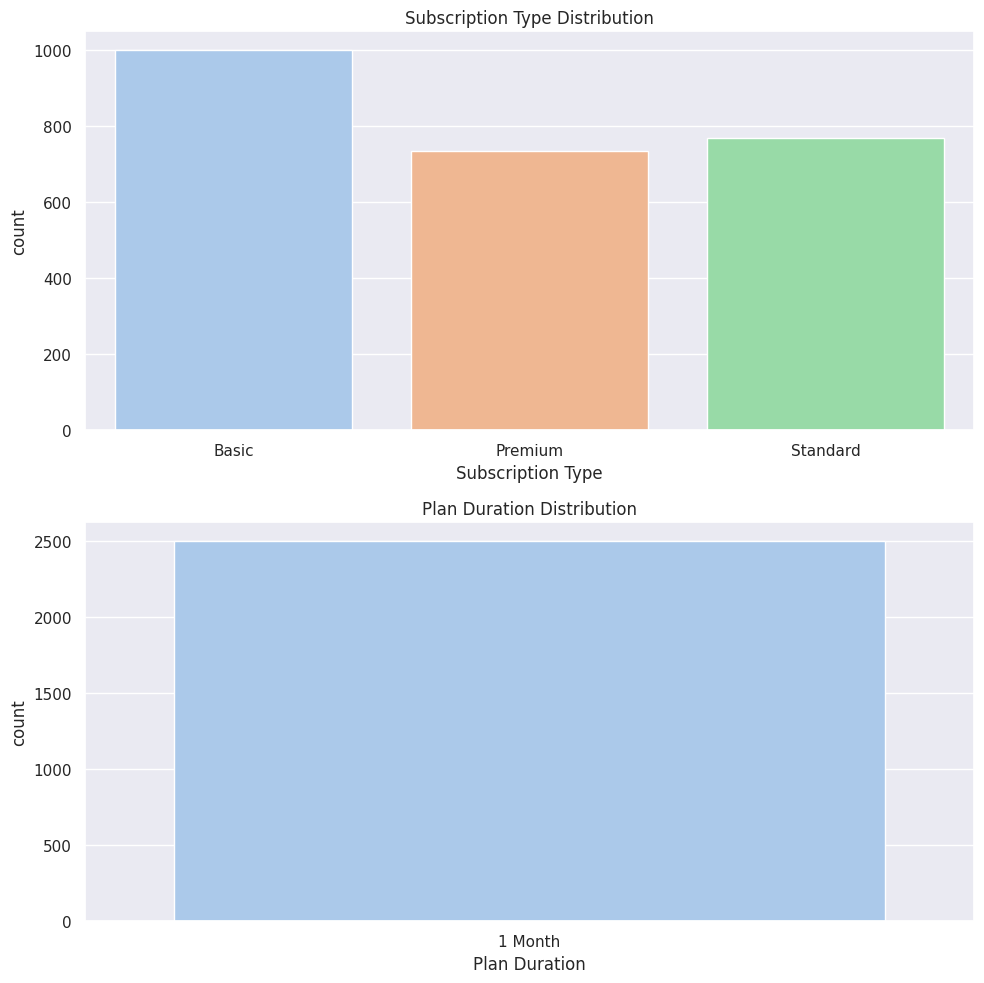

In [ ]:
fig, axes = plt.subplots(2, 1, figsize= (10,10))

sns.countplot(data= data1, x= 'Subscription Type', palette='pastel', ax= axes[0])
axes[0].set_title('Subscription Type Distribution')

sns.countplot(data=data1, x="Plan Duration", palette ='pastel', ax= axes[1])
axes[1].set_title('Plan Duration Distribution')

plt.tight_layout()
plt.show()

In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   User ID            2500 non-null   int64         
 1   Subscription Type  2500 non-null   object        
 2   Monthly Revenue    2500 non-null   int64         
 3   Join Date          2500 non-null   datetime64[ns]
 4   Last Payment Date  2500 non-null   object        
 5   Country            2500 non-null   object        
 6   Age                2500 non-null   int64         
 7   Gender             2500 non-null   object        
 8   Device             2500 non-null   object        
 9   Plan Duration      2500 non-null   object        
 10  Latitude           2500 non-null   float64       
 11  Longitude          2500 non-null   float64       
 12  continent          2500 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(3), object(7)
memory us

In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   User ID            2500 non-null   int64         
 1   Subscription Type  2500 non-null   object        
 2   Monthly Revenue    2500 non-null   int64         
 3   Join Date          2500 non-null   datetime64[ns]
 4   Last Payment Date  2500 non-null   object        
 5   Country            2500 non-null   object        
 6   Age                2500 non-null   int64         
 7   Gender             2500 non-null   object        
 8   Device             2500 non-null   object        
 9   Plan Duration      2500 non-null   object        
 10  Latitude           2500 non-null   float64       
 11  Longitude          2500 non-null   float64       
 12  continent          2500 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(3), object(7)
memory us

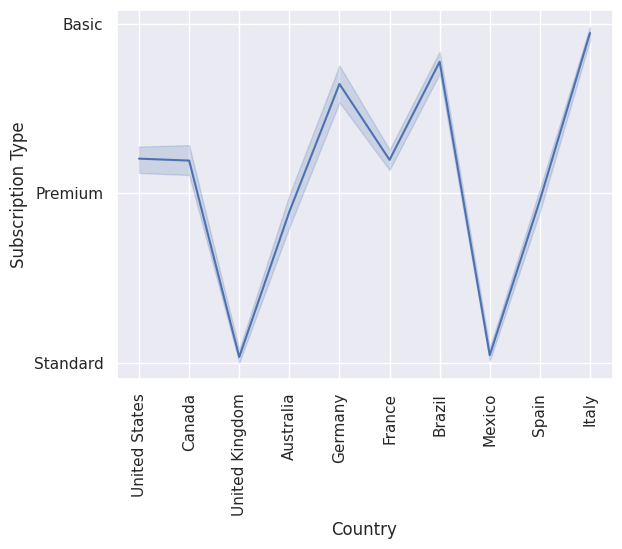

In [ ]:
sns.lineplot(data=data1, y='Subscription Type', x='Country')
plt.xticks(rotation=90)
plt.show();

In [ ]:
import plotly.express as px
subscription_counts = data1.groupby(['Country', 'Subscription Type'])['User ID'].count().reset_index()
fig = px.bar(subscription_counts, x='Country', y='User ID', color='Subscription Type',
             title='Subscription Plan Counts by Country', labels={'User ID': 'Number of Subscriptions'})

fig.update_xaxes(categoryorder='total ascending')
fig.update_layout(xaxis_title='Country', yaxis_title='Number of Subscriptions')
fig.update_layout(xaxis_tickangle=-45)
fig.update_layout(width=9*100 , height=5*100)
fig.show()

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   User ID            2500 non-null   int64         
 1   Subscription Type  2500 non-null   object        
 2   Monthly Revenue    2500 non-null   int64         
 3   Join Date          2500 non-null   datetime64[ns]
 4   Last Payment Date  2500 non-null   object        
 5   Country            2500 non-null   object        
 6   Age                2500 non-null   int64         
 7   Gender             2500 non-null   object        
 8   Device             2500 non-null   object        
 9   Plan Duration      2500 non-null   object        
 10  Latitude           2500 non-null   float64       
 11  Longitude          2500 non-null   float64       
 12  continent          2500 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(3), object(7)
memory us

In [ ]:
data1.head()

,User ID,Subscription Type,Monthly Revenue,Join Date,Last Payment Date,Country,Age,Gender,Device,Plan Duration,Latitude,Longitude,continent
0,1,Basic,10,2022-01-15,10-06-23,United States,28,Male,Smartphone,1 Month,39.783730,-100.445882,The Americas
1,2,Premium,15,2021-05-09,22-06-23,Canada,35,Female,Tablet,1 Month,61.066692,-107.991707,The Americas
2,3,Standard,12,2023-02-28,27-06-23,United Kingdom,42,Male,Smart TV,1 Month,54.702354,-3.276575,Europe
3,4,Standard,12,2022-10-07,26-06-23,Australia,51,Female,Laptop,1 Month,-24.776109,134.755000,Oceania
4,5,Basic,10,2023-01-05,28-06-23,Germany,33,Male,Smartphone,1 Month,40.420348,-79.116698,Europe


In [ ]:
data1['Join Date']= pd.to_datetime(data1['Join Date'], format='%d-%m-%y')
data1['Last Payment Date']= pd.to_datetime(data1['Last Payment Date'], format='%d-%m-%y')
data1['Duraction(days)']= (data1['Last Payment Date']- data1['Join Date']).dt.days
# Lọc giá trị dương của cột 'Duraction(days)'
data1 = data1[data1['Duraction(days)'] > 0]
data1.head()

,User ID,Subscription Type,Monthly Revenue,Join Date,Last Payment Date,Country,Age,Gender,Device,Plan Duration,Latitude,Longitude,continent,Duraction(days)
0,1,Basic,10,2022-01-15,2023-06-10,United States,28,Male,Smartphone,1 Month,39.783730,-100.445882,The Americas,511
1,2,Premium,15,2021-05-09,2023-06-22,Canada,35,Female,Tablet,1 Month,61.066692,-107.991707,The Americas,774
2,3,Standard,12,2023-02-28,2023-06-27,United Kingdom,42,Male,Smart TV,1 Month,54.702354,-3.276575,Europe,119
3,4,Standard,12,2022-10-07,2023-06-26,Australia,51,Female,Laptop,1 Month,-24.776109,134.755000,Oceania,262
4,5,Basic,10,2023-01-05,2023-06-28,Germany,33,Male,Smartphone,1 Month,40.420348,-79.116698,Europe,174


In [ ]:
data1['Duration(months)'] = data1['Duraction(days)'] / 30

data1['Generated Revenue($)'] = data1['Monthly Revenue'] * data1['Duration(months)']

data1.head()

<ipython-input-40-eb12acf77770>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-40-eb12acf77770>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,User ID,Subscription Type,Monthly Revenue,Join Date,Last Payment Date,Country,Age,Gender,Device,Plan Duration,Latitude,Longitude,continent,Duraction(days),Duration(months),Generated Revenue($)
0,1,Basic,10,2022-01-15,2023-06-10,United States,28,Male,Smartphone,1 Month,39.783730,-100.445882,The Americas,511,17.033333,170.333333
1,2,Premium,15,2021-05-09,2023-06-22,Canada,35,Female,Tablet,1 Month,61.066692,-107.991707,The Americas,774,25.800000,387.000000
2,3,Standard,12,2023-02-28,2023-06-27,United Kingdom,42,Male,Smart TV,1 Month,54.702354,-3.276575,Europe,119,3.966667,47.600000
3,4,Standard,12,2022-10-07,2023-06-26,Australia,51,Female,Laptop,1 Month,-24.776109,134.755000,Oceania,262,8.733333,104.800000
4,5,Basic,10,2023-01-05,2023-06-28,Germany,33,Male,Smartphone,1 Month,40.420348,-79.116698,Europe,174,5.800000,58.000000


<ipython-input-41-69c125a623e1>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



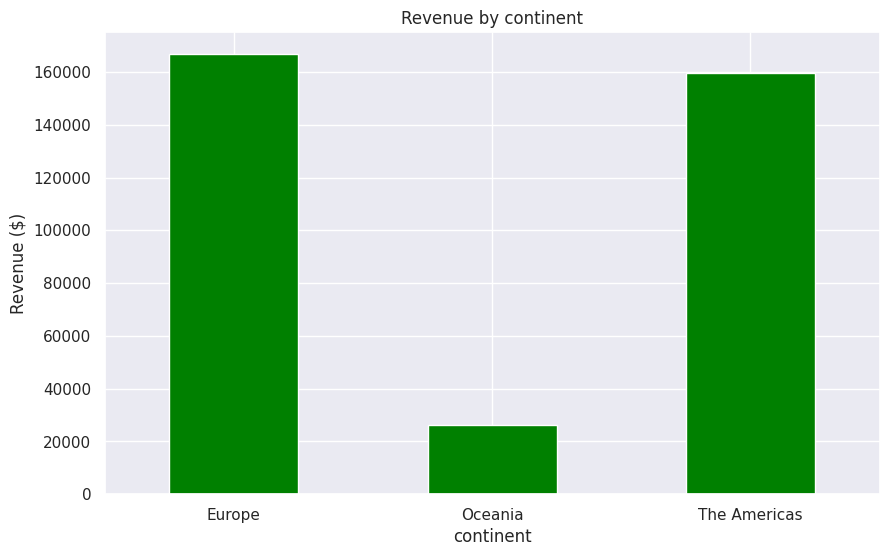

In [ ]:
data1['Generated Revenue($)'] = pd.to_numeric(data1['Generated Revenue($)'])
revenue_by_continent = data1.groupby('continent')['Generated Revenue($)'].sum()
plt.figure(figsize=(10, 6))
revenue_by_continent.plot(kind='bar', color='green')
plt.xlabel('continent')
plt.ylabel('Revenue ($)')
plt.title('Revenue by continent')
plt.xticks(rotation=0)
plt.show()


In [ ]:
data1['Duration(months)'].describe()

count    2487.000000
mean       11.338869
std         2.975102
min         0.266667
25%         9.000000
50%        11.133333
75%        12.666667
max        25.866667
Name: Duration(months), dtype: float64

In [ ]:
data = data1['Duration(months)']
data.head()

0    17.033333
1    25.800000
2     3.966667
3     8.733333
4     5.800000
Name: Duration(months), dtype: float64

In [ ]:
data1['Duration(months)']

0       17.033333
1       25.800000
2        3.966667
3        8.733333
4        5.800000
          ...    
2495    11.733333
2496    15.400000
2497    10.333333
2498     7.200000
2499    11.100000
Name: Duration(months), Length: 2487, dtype: float64

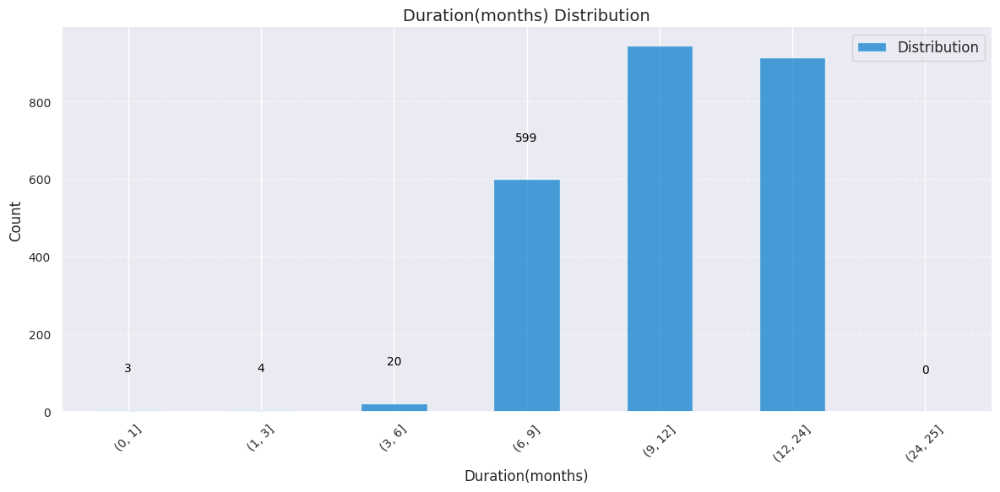

In [ ]:
interval = [0, 1, 3, 6, 9, 12, 24, 25]
#interval = [0, 1, 2, 3, 5, 10, 30, 100, 1232]
data1['Duration(months)'] = pd.cut(data1['Duration(months)'], interval)

distribution = data1['Duration(months)'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
ax = distribution.plot(kind='bar', color='#007acc', alpha=0.7)
ax.yaxis.grid(True, linestyle='--', alpha=0.6)

plt.xlabel('Duration(months)', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Duration(months) Distribution', fontsize=14)
ax.legend(['Distribution'], fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
for i in ax.patches:
    ax.annotate(str(i.get_height()), (i.get_x() + i.get_width() / 2, i.get_height() + 100),
                ha='center', fontsize=10, color='black')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
data1['Generated Revenue($)'].describe()

count    2487.000000
mean      141.840826
std        41.952521
min         2.666667
25%       111.100000
50%       136.400000
75%       167.500000
max       387.000000
Name: Generated Revenue($), dtype: float64

In [ ]:
data_r = data1['Generated Revenue($)']
data_r.head()

0    170.333333
1    387.000000
2     47.600000
3    104.800000
4     58.000000
Name: Generated Revenue($), dtype: float64

In [ ]:
data1['Generated Revenue($)']


0       170.333333
1       387.000000
2        47.600000
3       104.800000
4        58.000000
           ...    
2495    164.266667
2496    231.000000
2497    124.000000
2498     93.600000
2499    166.500000
Name: Generated Revenue($), Length: 2487, dtype: float64

In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2487 entries, 0 to 2499
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   User ID               2487 non-null   int64         
 1   Subscription Type     2487 non-null   object        
 2   Monthly Revenue       2487 non-null   int64         
 3   Join Date             2487 non-null   datetime64[ns]
 4   Last Payment Date     2487 non-null   datetime64[ns]
 5   Country               2487 non-null   object        
 6   Age                   2487 non-null   int64         
 7   Gender                2487 non-null   object        
 8   Device                2487 non-null   object        
 9   Plan Duration         2487 non-null   object        
 10  Latitude              2487 non-null   float64       
 11  Longitude             2487 non-null   float64       
 12  continent             2487 non-null   object        
 13  Duraction(days)   

In [ ]:
data1['Generated Revenue($)']

0       (0.0, 50.0]
1       (0.0, 50.0]
2               NaN
3       (0.0, 50.0]
4       (0.0, 50.0]
           ...     
2495    (0.0, 50.0]
2496    (0.0, 50.0]
2497    (0.0, 50.0]
2498    (0.0, 50.0]
2499    (0.0, 50.0]
Name: Generated Revenue($), Length: 2487, dtype: category
Categories (5, interval[int64, right]): [(0, 50] < (50, 100] < (100, 150] < (150, 200] <
                                         (200, 387]]

In [ ]:
data1['Generated Revenue($)'] = data1['Generated Revenue($)'].cat.codes

TypeError: ignored

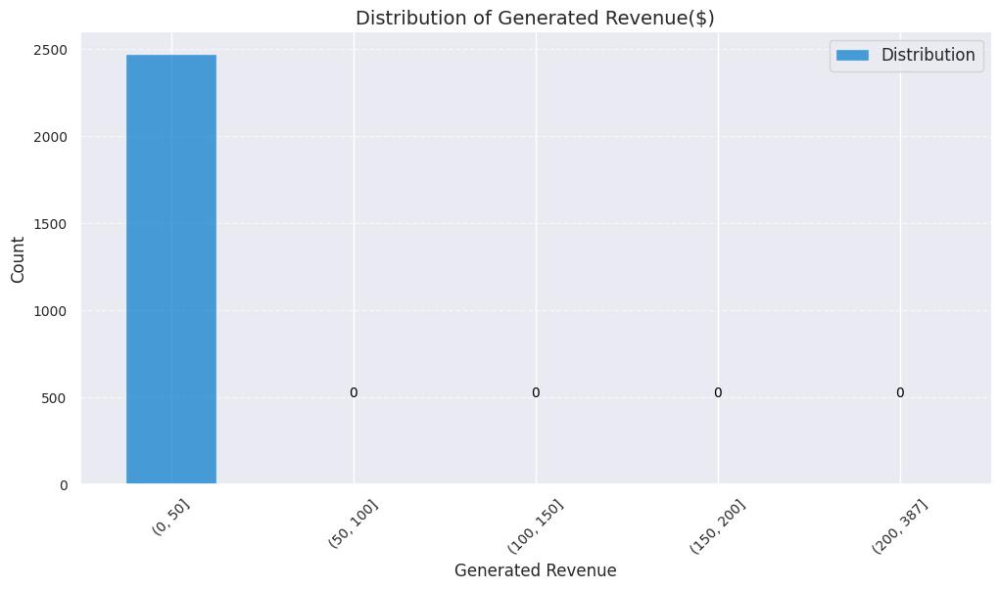

In [ ]:
interval = [0, 50, 100, 150,  200, 387]
data1['Generated Revenue($)']= pd.cut(data1['Generated Revenue($)'], interval)

distribution= data1['Generated Revenue($)'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
ax = distribution.plot(kind='bar', color='#007acc', alpha=0.7)
ax.yaxis.grid(True, linestyle='--', alpha=0.6)

plt.xlabel('Generated Revenue', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Generated Revenue($)', fontsize=14)
ax.legend(['Distribution'], fontsize=12)

plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
for i in ax.patches:
    ax.annotate(str(i.get_height()), (i.get_x() + i.get_width() / 2, i.get_height() + 500),
                ha='center', fontsize=10, color='black')

media_monetary = data1['Generated Revenue($)'].mean()
plt.axvline(x=interval.index(interval[-1]), color='red', linestyle='--', label=f'Media: ${media_monetary:.2f}')

ax.legend(['Distribution', f'Media: ${media_monetary:.2f}'], fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
data1.head()

,User ID,Subscription Type,Monthly Revenue,Join Date,Last Payment Date,Country,Age,Gender,Device,Plan Duration,Latitude,Longitude,continent,Duraction(days),Duration(months),Generated Revenue($)
0,1,Basic,10,2022-01-15,2023-06-10,United States,28,Male,Smartphone,1 Month,39.783730,-100.445882,The Americas,511,"(12.0, 24.0]","(0.0, 50.0]"
1,2,Premium,15,2021-05-09,2023-06-22,Canada,35,Female,Tablet,1 Month,61.066692,-107.991707,The Americas,774,NaN,"(0.0, 50.0]"
2,3,Standard,12,2023-02-28,2023-06-27,United Kingdom,42,Male,Smart TV,1 Month,54.702354,-3.276575,Europe,119,"(3.0, 6.0]",NaN
3,4,Standard,12,2022-10-07,2023-06-26,Australia,51,Female,Laptop,1 Month,-24.776109,134.755000,Oceania,262,"(6.0, 9.0]","(0.0, 50.0]"
4,5,Basic,10,2023-01-05,2023-06-28,Germany,33,Male,Smartphone,1 Month,40.420348,-79.116698,Europe,174,"(3.0, 6.0]","(0.0, 50.0]"


In [ ]:
data1['Subscription Type'].info()

<class 'pandas.core.series.Series'>
Int64Index: 2487 entries, 0 to 2499
Series name: Subscription Type
Non-Null Count  Dtype 
--------------  ----- 
2487 non-null   object
dtypes: object(1)
memory usage: 38.9+ KB


In [ ]:
def segment_customers(row):
    if row['Subscription Type'] == 'Premium' and row['Duration(months)'] > 12 and row['Generated Revenue($)'] > 200:
        return 'Loyal Premium Spenders'
    elif row['Subscription Type'] == 'Basic' and row['Duration(months)'] < 6:
        return 'Short-term Basic Users'
    else:
        return 'Other'
data1['Segment'] = data1.apply(segment_customers, axis=1)
print(data1)


TypeError: ignored

In [ ]:
data1['Segment'].describe()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Vẽ biểu đồ tròn cho các phân khúc
segment_counts = data1['Segment'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(segment_counts, labels=segment_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Customer Segmentation')

plt.axis('equal')  # Đảm bảo biểu đồ tròn
plt.show()



KeyError: ignored

In [ ]:
# # 'Duration Frequency','Spending Habits'
# categorical_cols = ['Subscription Type']

# encoded_mapping = {}

# for col in categorical_cols:
#    label_encoder = LabelEncoder()
#    encoded_values = data1[col].unique()
#    label_encoder.fit(encoded_values)
#    data1[col] = label_encoder.transform(data1[col])
#    encoded_mapping[col] = dict(zip(label_encoder.transform(encoded_values), encoded_values))

# #Print the mapping
# for col, mapping in encoded_mapping.items():
#   print(f"{col} Mapping:")
#   print(mapping)

In [ ]:
# # Kết hợp loại đăng ký
# data1['Customer Segment'] = 1/3* data1['Subscription Type'] +1/3 * data1['Duration Frequency'] +1/3 * data1['Spending Habits']
# data1['Customer Segment']*=3
# # Hiển thị kết quả
# print(data1[['User ID', 'Duration Frequency', 'Spending Habits', 'Customer Segment']])

In [ ]:
data1['Customer Segment'].describe()

In [ ]:
data1.head()

In [ ]:
data1.info()

In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Đảm bảo cột "Generated Revenue($)" đã được chuyển sang kiểu số (nếu chưa)
# data1['Generated Revenue($)'] = pd.to_numeric(data1['Generated Revenue($)'])

# # Tạo DataFrame với thông tin số lượng người đăng ký và phân khúc
# segment_counts = data1['Customer Segment'].value_counts()

# # Vẽ biểu đồ cột
# plt.figure(figsize=(10, 6))
# segment_counts.plot(kind='bar', color='skyblue')
# plt.title('Customer Segmentation')
# plt.xlabel('Customer Segment')
# plt.ylabel('Number of Customers')
# plt.xticks(rotation=45)
# plt.tight_layout()
# plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Đảm bảo cột "Generated Revenue($)" đã được chuyển sang kiểu số (nếu chưa)
data1['Generated Revenue($)'] = pd.to_numeric(data1['Generated Revenue($)'])

# Tạo DataFrame với thông tin doanh thu và ngày tham gia
revenue_by_date = data1.groupby('continent')['Generated Revenue($)'].sum()

# Tạo DataFrame với thông tin số lượng người đăng ký và ngày tham gia
subscribers_by_date = data1.groupby('continent')['User ID'].count()

# Vẽ biểu đồ kết hợp cột và đường
fig, ax1 = plt.subplots(figsize=(12, 6))

# Biểu đồ cột cho số lượng người đăng ký
ax1.bar(subscribers_by_date.index, subscribers_by_date, color='skyblue', width=0.4, label='Number of Subscribers')
ax1.set_xlabel('continent')
ax1.set_ylabel('Number of Subscribers', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Tạo một twin y-axis cho biểu đồ đường
ax2 = ax1.twinx()

# Biểu đồ đường cho doanh thu
ax2.plot(revenue_by_date.index, revenue_by_date, color='green', label='Revenue', marker='o')
ax2.set_ylabel('Revenue ($)', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Bỏ gạch ngang trên biểu đồ
ax1.grid(False)
ax2.grid(False)

# Đặt tiêu đề
plt.title('Number of Subscribers and Revenue by continent')

# Hiển thị legend
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='center')

plt.xticks(rotation=45)
plt.show()


In [ ]:
data1.info()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Đảm bảo cột "Generated Revenue($)" đã được chuyển sang kiểu số (nếu chưa)
data1['Generated Revenue($)'] = pd.to_numeric(data1['Generated Revenue($)'])

# Tạo DataFrame với thông tin doanh thu và ngày tham gia
revenue_by_date = data1.groupby('Gender')['Generated Revenue($)'].sum()

# Tạo DataFrame với thông tin số lượng người đăng ký và ngày tham gia
subscribers_by_date = data1.groupby('Gender')['User ID'].count()

# Vẽ biểu đồ kết hợp cột và đường
fig, ax1 = plt.subplots(figsize=(12, 6))

# Biểu đồ cột cho số lượng người đăng ký
ax1.bar(subscribers_by_date.index, subscribers_by_date, color='skyblue', width=0.4, label='Number of Subscribers')
ax1.set_xlabel('Gender')
ax1.set_ylabel('Number of Subscribers', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Tạo một twin y-axis cho biểu đồ đường
ax2 = ax1.twinx()

# Biểu đồ đường cho doanh thu
ax2.plot(revenue_by_date.index, revenue_by_date, color='green', label='Revenue', marker='o')
ax2.set_ylabel('Revenue ($)', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Bỏ gạch ngang trên biểu đồ
ax1.grid(False)
ax2.grid(False)

# Đặt tiêu đề
plt.title('Number of Subscribers and Revenue by Gender')

# Hiển thị legend
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='right')

plt.xticks(rotation=45)
plt.show()

TypeError: ignored

In [ ]:
total_revenue_by_plan = data1.groupby('Subscription Type')['Generated Revenue($)'].sum()

plt.figure(figsize=(8, 6))
total_revenue_by_plan.plot(kind='bar', color='green')
plt.title('Total Monthly Revenue by Netflix Subscription Category')
plt.xlabel('Subscription Type')
plt.ylabel('Total Monthly Revenue ($)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### Phân cụm

In [ ]:
data1.isna().sum()

In [ ]:

#checking datatype
data1.dtypes

In [ ]:
data1.head()

In [ ]:
correlation = data1.corr()
plt.figure(figsize=(10,10))
plt.title('Heatmap of Revenue')
ax = sns.heatmap(correlation, square=True, annot=True, fmt='.2f', linecolor='white')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_yticklabels(ax.get_yticklabels(), rotation=30)
plt.show()

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

revenue_data = data1.groupby(data1['Join Date'].dt.to_period('M'))['Generated Revenue($)'].sum()

model = SARIMAX(revenue_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
results = model.fit()

forecast = results.get_forecast(steps=6)
forecast_mean = forecast.predicted_mean

plt.figure(figsize=(12, 6))
plt.plot(revenue_data.index, revenue_data.values, label='Doanh thu thực tế', marker='o')
plt.plot(forecast_mean.index, forecast_mean.values, label='Dự báo doanh thu', linestyle='--', marker='o')
plt.title('Dự đoán Doanh thu tháng và Năm')
plt.xlabel('Thời gian (Tháng)')
plt.ylabel('Doanh thu ($)')
plt.legend()
plt.show()


### Data2

In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
import pandas as pd

In [ ]:
data2= pd.read_csv('/content/gdrive/MyDrive/Netflix/netflix_titles.csv')
data2.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [ ]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8807 non-null   object
 1   type          8807 non-null   object
 2   title         8807 non-null   object
 3   director      6173 non-null   object
 4   cast          7982 non-null   object
 5   country       7976 non-null   object
 6   date_added    8797 non-null   object
 7   release_year  8807 non-null   int64 
 8   rating        8803 non-null   object
 9   duration      8804 non-null   object
 10  listed_in     8807 non-null   object
 11  description   8807 non-null   object
dtypes: int64(1), object(11)
memory usage: 825.8+ KB


In [ ]:
data2.isnull().sum()

show_id            0
type               0
title              0
director        2634
cast             825
country          831
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64

In [ ]:
data2 = data2.drop(['director', 'cast'], axis=1)
data2.columns

Index(['show_id', 'type', 'title', 'country', 'date_added', 'release_year',
       'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
data2.duplicated().sum()

0

In [ ]:
import seaborn as sns

In [ ]:
import plotly.express as px

In [ ]:
fig = px.pie(data2['type'].value_counts().reset_index(), values='type', names='index')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [ ]:
data2['rating'].unique()

array(['PG-13', 'TV-MA', 'PG', 'TV-14', 'TV-PG', 'TV-Y', 'TV-Y7', 'R',
       'TV-G', 'G', 'NC-17', '74 min', '84 min', '66 min', 'NR', nan,
       'TV-Y7-FV', 'UR'], dtype=object)

In [ ]:
data2[data2['duration'].isna()]

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description
5541,s5542,Movie,Louis C.K. 2017,United States,"April 4, 2017",2017,74 min,NaN,Movies,"Louis C.K. muses on religion, eternal love, gi..."
5794,s5795,Movie,Louis C.K.: Hilarious,United States,"September 16, 2016",2010,84 min,NaN,Movies,Emmy-winning comedy writer Louis C.K. brings h...
5813,s5814,Movie,Louis C.K.: Live at the Comedy Store,United States,"August 15, 2016",2015,66 min,NaN,Movies,The comic puts his trademark hilarious/thought...


In [ ]:
import numpy as np

In [ ]:
data2.loc[5541, 'duration'] = '74 min'
data2.loc[5541, 'rating'] = np.nan

data2.loc[5794, 'duration'] = '84 min'
data2.loc[5794, 'rating'] = np.nan

data2.loc[5541, 'duration'] = '66 min'
data2.loc[5813, 'rating'] = np.nan


In [ ]:
data2[data2['duration'].isna()]

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description
5813,s5814,Movie,Louis C.K.: Live at the Comedy Store,United States,"August 15, 2016",2015,NaN,NaN,Movies,The comic puts his trademark hilarious/thought...


In [ ]:
import matplotlib.pyplot as plt

<ipython-input-27-c389cd75a4b6>:2: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



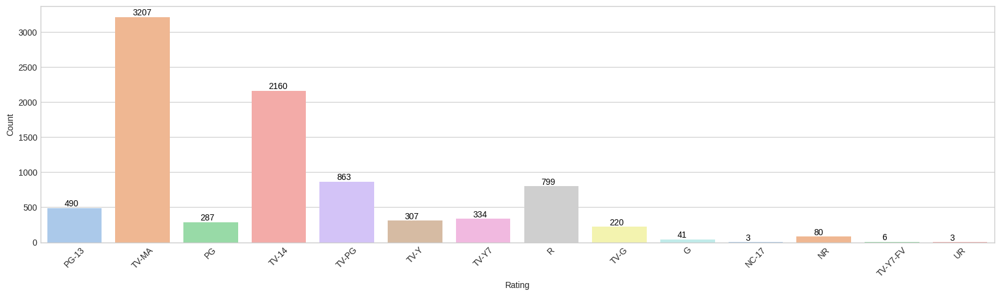

In [ ]:
plt.figure(figsize = (20, 5))
plt.style.use('seaborn-whitegrid')
ax = sns.countplot(x = 'rating',palette='pastel', data = data2)
plt.xlabel('Rating')
plt.ylabel('Count')
plt.xticks(rotation = 45)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x()+0.25, p.get_height()+1), va = 'bottom', color = 'black')

In [ ]:
ratings_ages = {
    'TV-PG' : 'Older Kids',
    'TV-Y7-FV' : 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14' : 'Teens',
    'R' : 'Adults',
    'TV-Y': 'Kids',
    'NR' : 'Adults',
    'PG-13' : 'Teens',
    'TV-G': 'Kids',
    'PG' : 'Older Kids',
    'G' : 'Kids',
    'UR' : 'Adults',
    'NC-17' : 'Adults'
}

In [ ]:
data2['target_ages'] = data2['rating'].replace(ratings_ages)
data2['target_ages'].unique()

array(['Teens', 'TV-MA', 'Older Kids', 'Kids', 'Adults', nan],
      dtype=object)

In [ ]:
data2.head()

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description,added_year,added_month,added_month_name,target_ages
0,s1,Movie,Dick Johnson Is Dead,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",2021.0,9.0,September,Teens
1,s2,TV Show,Blood & Water,South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",2021.0,9.0,September,TV-MA
2,s3,TV Show,Ganglands,NaN,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,2021.0,9.0,September,TV-MA
3,s4,TV Show,Jailbirds New Orleans,NaN,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",2021.0,9.0,September,TV-MA
4,s5,TV Show,Kota Factory,India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,2021.0,9.0,September,TV-MA


In [ ]:
data2['country'].head(10)

0                                        United States
1                                         South Africa
2                                                  NaN
3                                                  NaN
4                                                India
5                                                  NaN
6                                                  NaN
7    United States, Ghana, Burkina Faso, United Kin...
8                                       United Kingdom
9                                        United States
Name: country, dtype: object

In [ ]:
data2[data2['rating'].isna()]

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description,added_year,added_month,added_month_name,target_ages
5541,s5542,Movie,Louis C.K. 2017,United States,2017-04-04,2017,NaN,66 min,Movies,"Louis C.K. muses on religion, eternal love, gi...",2017.0,4.0,April,NaN
5794,s5795,Movie,Louis C.K.: Hilarious,United States,2016-09-16,2010,NaN,84 min,Movies,Emmy-winning comedy writer Louis C.K. brings h...,2016.0,9.0,September,NaN
5813,s5814,Movie,Louis C.K.: Live at the Comedy Store,United States,2016-08-15,2015,NaN,NaN,Movies,The comic puts his trademark hilarious/thought...,2016.0,8.0,August,NaN
5989,s5990,Movie,13TH: A Conversation with Oprah Winfrey & Ava ...,NaN,2017-01-26,2017,NaN,37 min,Movies,Oprah Winfrey sits down with director Ava DuVe...,2017.0,1.0,January,NaN
6827,s6828,TV Show,Gargantia on the Verdurous Planet,Japan,2016-12-01,2013,NaN,1 Season,"Anime Series, International TV Shows","After falling through a wormhole, a space-dwel...",2016.0,12.0,December,NaN
7312,s7313,TV Show,Little Lunch,Australia,2018-02-01,2015,NaN,1 Season,"Kids' TV, TV Comedies","Adopting a child's perspective, this show take...",2018.0,2.0,February,NaN
7537,s7538,Movie,My Honor Was Loyalty,Italy,2017-03-01,2015,NaN,115 min,Dramas,"Amid the chaos and horror of World War II, a c...",2017.0,3.0,March,NaN


In [ ]:
data2 = data2[data2['date_added'].notna()]
data2

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description,added_year,added_month,added_month_name,target_ages
0,s1,Movie,Dick Johnson Is Dead,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",2021.0,9.0,September,Teens
1,s2,TV Show,Blood & Water,South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",2021.0,9.0,September,TV-MA
2,s3,TV Show,Ganglands,NaN,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,2021.0,9.0,September,TV-MA
3,s4,TV Show,Jailbirds New Orleans,NaN,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",2021.0,9.0,September,TV-MA
4,s5,TV Show,Kota Factory,India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,2021.0,9.0,September,TV-MA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8802,s8803,Movie,Zodiac,United States,2019-11-20,2007,R,158 min,"Cult Movies, Dramas, Thrillers","A political cartoonist, a crime reporter and a...",2019.0,11.0,November,Adults
8803,s8804,TV Show,Zombie Dumb,NaN,2019-07-01,2018,TV-Y7,2 Seasons,"Kids' TV, Korean TV Shows, TV Comedies","While living alone in a spooky town, a young g...",2019.0,7.0,July,Older Kids
8804,s8805,Movie,Zombieland,United States,2019-11-01,2009,R,88 min,"Comedies, Horror Movies",Looking to survive in a world taken over by zo...,2019.0,11.0,November,Adults
8805,s8806,Movie,Zoom,United States,2020-01-11,2006,PG,88 min,"Children & Family Movies, Comedies","Dragged from civilian life, a former superhero...",2020.0,1.0,January,Older Kids


In [ ]:
#data2['year_added'] = data2['date_added'].apply(lambda x: x.split(" ")[-1])
#data2['year_added'].head()

In [ ]:
#data2['month_added'] = data2['date_added'].apply(lambda x: x.split(" ")[0])
#data2['month_added'].head()

In [ ]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8797 entries, 0 to 8806
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   show_id           8797 non-null   object        
 1   type              8797 non-null   object        
 2   title             8797 non-null   object        
 3   country           7967 non-null   object        
 4   date_added        8797 non-null   datetime64[ns]
 5   release_year      8797 non-null   int64         
 6   rating            8790 non-null   object        
 7   duration          8796 non-null   object        
 8   listed_in         8797 non-null   object        
 9   description       8797 non-null   object        
 10  added_year        8797 non-null   float64       
 11  added_month       8797 non-null   float64       
 12  added_month_name  8797 non-null   object        
 13  target_ages       8790 non-null   object        
dtypes: datetime64[ns](1), fl

In [ ]:
import plotly.express as px

In [ ]:
# converting the pandas dataframe to datatime format
data2['date_added'] = pd.to_datetime(data2['date_added'])
data2['added_year'] = data2['date_added'].dt.year
data2['added_month'] = data2['date_added'].dt.month
data2['added_month_name'] = data2['date_added'].dt.month_name()


# creating a series of time data

add_year = data2['added_year'].value_counts()
release = data2['release_year'].value_counts()

# creating a dataframe

add_df = pd.DataFrame({'year': add_year.index, 'added_year': add_year.values})
release_df = pd.DataFrame({'year': release.index, 'release_year': release.values})
#release_df['year'] = release_df['year'].astype(int)
year_df = pd.merge(add_df, release_df, how = 'right', on = 'year')
year_df.fillna('0', inplace = True)
year_df['added_year'] = year_df.added_year.astype('int')

year_df = year_df.sort_values('year', ascending = False).reset_index(drop = True)

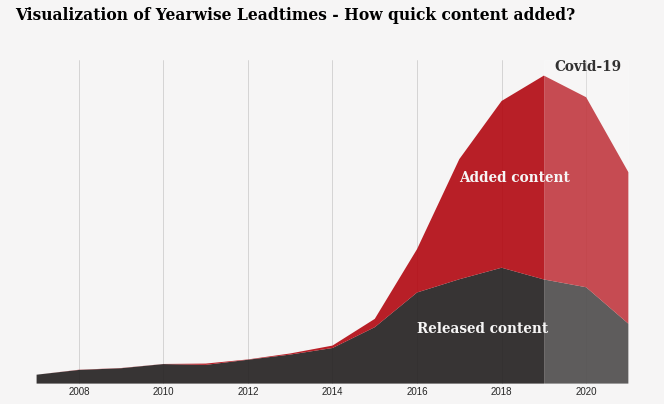

In [ ]:
## visulaization

fig, ax = plt.subplots(figsize = (12,6), dpi = 70)
fig.patch.set_facecolor('#f6f5f5')
ax.set_facecolor('#f6f5f5')

labels = [ 'Released content', 'Added content ']

# stackplot
ax.stackplot(year_df.year[0:15], year_df.release_year[0:15],year_df.added_year[0:15],labels =labels,
              colors = ['#221f1f','#b20710',], baseline = 'zero', alpha = 0.9 )

# Region of interest

ax.axvspan(2019,2021, color = 'white',alpha = 0.2)
ax.text(2019.25, 3100, 'Covid-19', {'font':'serif', 'fontsize': '14', 'color': 'black', 'weight':'bold'},alpha = 0.8)

# legend
ax.text(2017, 2000, '{}'.format(labels[1]), {'font':'serif', 'fontsize':'14', 'color':'#f6f5f5', 'weight':'bold'})
ax.text(2016, 500, '{}'.format(labels[0]),{'font':'serif', 'fontsize':'14', 'color':'#f6f5f5','weight':'bold'})

#title

ax.text(2006.5, 3600, 'Visualization of Yearwise Leadtimes - How quick content added?',
                      {'font':'serif', 'fontsize':'16', 'weight': 'bold','color': 'black'})
#ax.text(2006.5, 3390, 'Looks like as internet is booming gap between content official \nrelease time and available time to platform is drastically reduced. ',
#                     {'font':'serif', 'fontsize':'12','color': 'black'})

plt.box(on = None)

ax.axes.get_yaxis().set_visible(False)
fig.show()

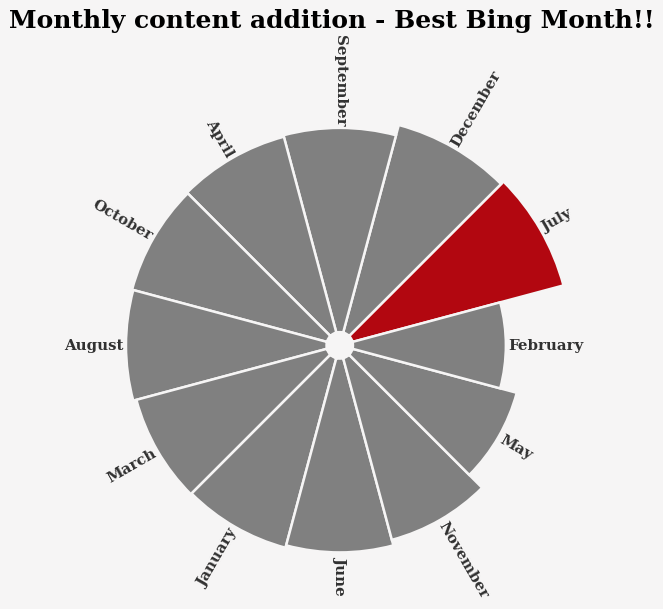

In [ ]:
added_month = data2['added_month'].value_counts()

# initialize the figure
fig = plt.figure(figsize=(14,7), dpi = 90)
fig.patch.set_facecolor('#f6f5f5')
ax.set_facecolor('#f6f5f5')
ax = plt.subplot(polar=True)
plt.axis('off')


## labels
label_map = {1:'January', 2:'February', 3:'March', 4:'April', 5:'May', 6:'June', 7:'July', 8:'August', 9:'September', 10:'October', 11:'November', 12:'December'}
lab = added_month.index
labels = lab.map(label_map)

colors = ['#b20710', 'grey', 'grey', 'grey', 'grey', 'grey', 'grey', 'grey', 'grey', 'grey', 'grey','grey']


# Constants = parameters controling the plot layout:
upperLimit = 1000
lowerLimit = 50
labelPadding = 10

# Compute max and min in the dataset
max = added_month.max()

slope = (max - lowerLimit) / max
heights = slope * added_month.values + lowerLimit

# Compute the width of each bar. In total we have 2*Pi = 360°
width = 2*np.pi / len(added_month.index)

# Compute the angle each bar is centered on:
indexes = list(range(1, len(added_month)+1))
angles = [element * width for element in indexes]


# Draw bars
bars = ax.bar(
    x=angles,
    height=heights,
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="#f6f5f5",
    color = colors,
)

# Add labels
for bar, angle, height, label in zip(bars,angles, heights, labels):

    # Labels are rotated. Rotation must be specified in degrees :(
    rotation = np.rad2deg(angle)

    # Flip some labels upside down
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    # Finally add the labels
    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor",**{'font':'serif', 'size':12, 'weight':'bold','color':'black'},alpha = 0.8)

fig.text(0.25,1.00,'Monthly content addition - Best Bing Month!!',{'font':'serif', 'size':20, 'weight':'bold','color':'black'})
#fig.text(0.25,0.975,'Christmas is real holiday!! most of the content was \nadding to platfrom at the end of the year ans \nnewyear for holiday season.',{'font':'serif', 'size':12,'color':'black'}, alpha = 0.7)
fig.show()

In [ ]:
data2.head()

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description,added_year,added_month,added_month_name,target_ages,principal_country
0,s1,Movie,Dick Johnson Is Dead,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",2021,9,September,Teens,United States
1,s2,TV Show,Blood & Water,South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",2021,9,September,NaN,South Africa
4,s5,TV Show,Kota Factory,India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,2021,9,September,NaN,India
7,s8,Movie,Sankofa,"United States, Ghana, Burkina Faso, United Kin...",2021-09-24,1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",2021,9,September,NaN,United States
8,s9,TV Show,The Great British Baking Show,United Kingdom,2021-09-24,2021,TV-14,9 Seasons,"British TV Shows, Reality TV",A talented batch of amateur bakers face off in...,2021,9,September,Teens,United Kingdom


In [ ]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7967 entries, 0 to 8806
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   show_id            7967 non-null   object        
 1   type               7967 non-null   category      
 2   title              7967 non-null   object        
 3   country            7967 non-null   object        
 4   date_added         7967 non-null   datetime64[ns]
 5   release_year       7967 non-null   int64         
 6   rating             7961 non-null   object        
 7   duration           7966 non-null   object        
 8   listed_in          7967 non-null   object        
 9   description        7967 non-null   object        
 10  added_year         7967 non-null   int64         
 11  added_month        7967 non-null   int64         
 12  added_month_name   7967 non-null   object        
 13  target_ages        5032 non-null   category      
 14  principa

In [ ]:
data2['type']= pd.Categorical(data2['type'])
data2['target_ages']= pd.Categorical(data2['target_ages'], categories =['Kids','Older Kids','Teens','Adults'])
#data2['year_added']= pd.to_numeric(data2['year_added'])

<ipython-input-59-b2f6b446bd8d>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-59-b2f6b446bd8d>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
data2 = data2[data2['country'].notna()]
data2


,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description,added_year,added_month,added_month_name,target_ages
0,s1,Movie,Dick Johnson Is Dead,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",2021,9,September,Teens
1,s2,TV Show,Blood & Water,South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",2021,9,September,NaN
4,s5,TV Show,Kota Factory,India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,2021,9,September,NaN
7,s8,Movie,Sankofa,"United States, Ghana, Burkina Faso, United Kin...",2021-09-24,1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",2021,9,September,NaN
8,s9,TV Show,The Great British Baking Show,United Kingdom,2021-09-24,2021,TV-14,9 Seasons,"British TV Shows, Reality TV",A talented batch of amateur bakers face off in...,2021,9,September,Teens
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8801,s8802,Movie,Zinzana,"United Arab Emirates, Jordan",2016-03-09,2015,TV-MA,96 min,"Dramas, International Movies, Thrillers",Recovering alcoholic Talal wakes up inside a s...,2016,3,March,NaN
8802,s8803,Movie,Zodiac,United States,2019-11-20,2007,R,158 min,"Cult Movies, Dramas, Thrillers","A political cartoonist, a crime reporter and a...",2019,11,November,Adults
8804,s8805,Movie,Zombieland,United States,2019-11-01,2009,R,88 min,"Comedies, Horror Movies",Looking to survive in a world taken over by zo...,2019,11,November,Adults
8805,s8806,Movie,Zoom,United States,2020-01-11,2006,PG,88 min,"Children & Family Movies, Comedies","Dragged from civilian life, a former superhero...",2020,1,January,Older Kids


In [ ]:
data2['principal_country']= data2['country'].apply(lambda x:  x.split(",")[0])
data2['principal_country'].head()

<ipython-input-45-706f95df6cfa>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0     United States
1      South Africa
4             India
7     United States
8    United Kingdom
Name: principal_country, dtype: object

In [ ]:
data2.isna().sum()

show_id                 0
type                    0
title                   0
country                 0
date_added              0
release_year            0
rating                  6
duration                1
listed_in               0
description             0
added_year              0
added_month             0
added_month_name        0
target_ages          2935
principal_country       0
dtype: int64

In [ ]:
#Tạo 1 df mới chứa thông tin về số lượng(tính = cách đếm số lượng show_id) đc nhóm theo rating, target_ages
def generate_rating_df(data2):
    rating_df = data2.groupby(['rating', 'target_ages']).agg({'show_id': 'count'}).reset_index()
    rating_df = rating_df[rating_df['show_id'] != 0]
    rating_df.columns = ['rating', 'target_ages', 'counts']
    rating_df = rating_df.sort_values('target_ages')
    return rating_df

In [ ]:
rating_df = generate_rating_df(data2)
fig = px.bar(rating_df, x='rating', y='counts', color='target_ages')
fig.show()

In [ ]:
data2['type'].unique()

['Movie', 'TV Show']
Categories (2, object): ['Movie', 'TV Show']

In [ ]:
movie_df= data2[data2['type']=='Movie']
show_df=data2[data2['type']=='TV Show']

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [ ]:
movie_rating_df = generate_rating_df(movie_df)
show_rating_df = generate_rating_df(show_df)

fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]])

fig.add_trace(
    go.Pie(labels=movie_rating_df['target_ages'], values=movie_rating_df['counts']),
    row=1, col=1
)

fig.add_trace(
    go.Pie(labels=show_rating_df['target_ages'], values=show_rating_df['counts']),
    row=1, col=2
)

fig.update_traces(textposition='inside', hole=.4, hoverinfo="label+percent+name")
fig.update_layout(
    title_text="Rating distribution by Type of content",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Movies', x=0.2, y=0.5, font_size=12, showarrow=False),
                 dict(text='TV Shows', x=0.81, y=0.5, font_size=12, showarrow=False)])
fig.show()

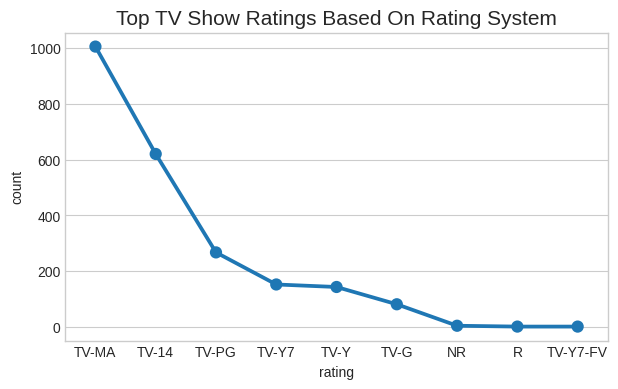

In [ ]:
#Pointplot on top tv show ratings
tv_ratings = show_df.groupby(['rating'])['show_id'].count().reset_index(name = 'count').sort_values(by = 'count', ascending = False)
fig_dims = (7,4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.pointplot(x='rating',y='count',data=tv_ratings)
plt.title('Top TV Show Ratings Based On Rating System',size='15')
plt.show()

In [ ]:
fig = px.histogram(data2, x='principal_country')
fig.update_xaxes(categoryorder='total descending')
fig.show()

In [ ]:
data2.head()

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description,added_year,added_month,added_month_name,target_ages,principal_country
0,s1,Movie,Dick Johnson Is Dead,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",2021,9,September,Teens,United States
1,s2,TV Show,Blood & Water,South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",2021,9,September,NaN,South Africa
4,s5,TV Show,Kota Factory,India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,2021,9,September,NaN,India
7,s8,Movie,Sankofa,"United States, Ghana, Burkina Faso, United Kin...",2021-09-24,1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",2021,9,September,NaN,United States
8,s9,TV Show,The Great British Baking Show,United Kingdom,2021-09-24,2021,TV-14,9 Seasons,"British TV Shows, Reality TV",A talented batch of amateur bakers face off in...,2021,9,September,Teens,United Kingdom


In [ ]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7967 entries, 0 to 8806
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   show_id            7967 non-null   object        
 1   type               7967 non-null   category      
 2   title              7967 non-null   object        
 3   country            7967 non-null   object        
 4   date_added         7967 non-null   datetime64[ns]
 5   release_year       7967 non-null   int64         
 6   rating             7961 non-null   object        
 7   duration           7966 non-null   object        
 8   listed_in          7967 non-null   object        
 9   description        7967 non-null   object        
 10  added_year         7967 non-null   int64         
 11  added_month        7967 non-null   int64         
 12  added_month_name   7967 non-null   object        
 13  target_ages        5032 non-null   category      
 14  principa

In [ ]:
released_year_df = data2.loc[data2['release_year'] > 2010].groupby(['release_year', 'type']).agg({'show_id': 'count'}).reset_index()
added_year_df = data2.loc[data2['added_year'] > 2010].groupby(['added_year', 'type']).agg({'show_id': 'count'}).reset_index()
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=released_year_df.loc[released_year_df['type'] == 'Movie']['release_year'],
    y=released_year_df.loc[released_year_df['type'] == 'Movie']['show_id'],
    mode='lines+markers',
    name='Movie: Released Year',
    marker_color='lightgreen',
))
fig.add_trace(go.Scatter(
    x=released_year_df.loc[released_year_df['type'] == 'TV Show']['release_year'],
    y=released_year_df.loc[released_year_df['type'] == 'TV Show']['show_id'],
    mode='lines+markers',
    name='TV Show: Released Year',
    marker_color='darkgreen',
))
fig.add_trace(go.Scatter(
    x=added_year_df.loc[added_year_df['type'] == 'Movie']['added_year'],
    y=added_year_df.loc[added_year_df['type'] == 'Movie']['show_id'],
    mode='lines+markers',
    name='Movie: Year Added',
    marker_color='orange',
))
fig.add_trace(go.Scatter(
    x=added_year_df.loc[added_year_df['type'] == 'TV Show']['added_year'],
    y=added_year_df.loc[added_year_df['type'] == 'TV Show']['show_id'],
    mode='lines+markers',
    name='TV Show: Year Added',
    marker_color='darkorange',
))
fig.update_xaxes(categoryorder='total descending')
fig.show()


<ipython-input-68-fbeafb8d3b0e>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




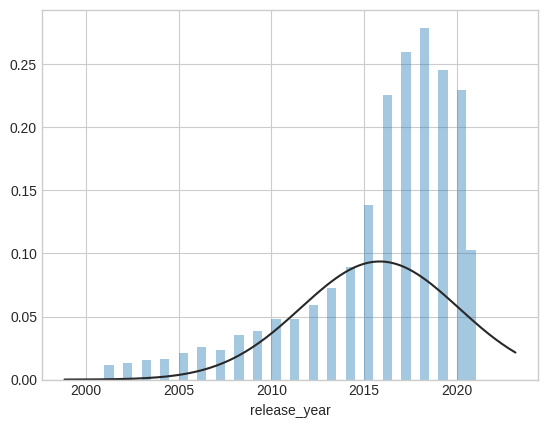

In [ ]:
from scipy.stats import norm
sns.distplot(data2.loc[data2['release_year'] > 2000, 'release_year'], fit=norm, kde=False);

In [ ]:
data2.head()

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description,added_year,added_month,added_month_name,target_ages,principal_country
0,s1,Movie,Dick Johnson Is Dead,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",2021,9,September,Teens,United States
1,s2,TV Show,Blood & Water,South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",2021,9,September,NaN,South Africa
4,s5,TV Show,Kota Factory,India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,2021,9,September,NaN,India
7,s8,Movie,Sankofa,"United States, Ghana, Burkina Faso, United Kin...",2021-09-24,1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",2021,9,September,NaN,United States
8,s9,TV Show,The Great British Baking Show,United Kingdom,2021-09-24,2021,TV-14,9 Seasons,"British TV Shows, Reality TV",A talented batch of amateur bakers face off in...,2021,9,September,Teens,United Kingdom


In [ ]:
fig = px.histogram(x=show_df['duration'])
fig.update_xaxes(categoryorder="total descending")
fig.update_layout(
    title="Distribution of shows duration",
    xaxis_title="Duration of the Show",
)
fig.show()

In [ ]:
fig = px.histogram(x=movie_df['duration'])
fig.update_xaxes(categoryorder="total descending")
fig.update_layout(
    title="Distribution of movie duration",
    xaxis_title="Duration of the Movie",
)
fig.show()

In [ ]:
movie_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5691 entries, 0 to 8806
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   show_id            5691 non-null   object        
 1   type               5691 non-null   category      
 2   title              5691 non-null   object        
 3   country            5691 non-null   object        
 4   date_added         5691 non-null   datetime64[ns]
 5   release_year       5691 non-null   int64         
 6   rating             5687 non-null   object        
 7   duration           5690 non-null   object        
 8   listed_in          5691 non-null   object        
 9   description        5691 non-null   object        
 10  added_year         5691 non-null   int64         
 11  added_month        5691 non-null   int64         
 12  added_month_name   5691 non-null   object        
 13  target_ages        3763 non-null   category      
 14  principa

In [ ]:
temp_duration = movie_df['duration'].apply(lambda x: int(x.split(' ')[0]) if isinstance(x, str) else x)


In [ ]:
movie_df.loc[temp_duration.loc[temp_duration < 90].index, 'duration_bin'] = 'Less than 1.30 hours'
movie_df.loc[temp_duration.loc[(temp_duration >= 90) & (temp_duration < 150)].index, 'duration_bin'] = 'More than 1.30 - less than 2.30 hours'
movie_df.loc[temp_duration.loc[temp_duration >= 150].index, 'duration_bin'] = 'More than 2.30 hours'

<ipython-input-74-2e6fc706070b>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
fig = px.histogram(x=movie_df['duration_bin'], color=movie_df['duration_bin'])
fig.update_xaxes(categoryorder = "array",
                categoryarray = ['Less than 1.30 hours', 'More than 1.30 - less than 2.30 hours', 'More than 2.30 hours'],
                )
fig.update_layout(
    title="Distribution of movies duration",
    xaxis_title="Duration of the Movies",
)
fig.show()

#### Genre

In [ ]:
data2.head()

In [ ]:
listed_in_count = data2.copy()
listed_in_count = pd.concat([listed_in_count, data2["listed_in"].str.split(",", expand = True)], axis = 1)
listed_in_count

In [ ]:
listed_in_count = listed_in_count.melt(id_vars = ["type", "title"], value_vars = range(3), value_name = "listed_in")
listed_in_count = listed_in_count[listed_in_count["listed_in"].notna()]
listed_in_count

In [ ]:
listed_in_count["listed_in"].unique()
plt.figure(figsize = (20, 8))
listed_in = listed_in_count["listed_in"].value_counts()[:20]
sns.barplot(x = listed_in, y = listed_in.index, palette = "Dark2")

In [ ]:
movie_df['genre'] = movie_df['listed_in'].apply(lambda x :  x.replace(' ,',',').replace(', ',',').split(','))
show_df['genre'] = show_df['listed_in'].apply(lambda x :  x.replace(' ,',',').replace(', ',',').split(','))

display(movie_df['genre'].head())
display(show_df['genre'].head())

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

def calculate_mlb(series):
    mlb = MultiLabelBinarizer()
    mlb_df = pd.DataFrame(mlb.fit_transform(series), columns=mlb.classes_, index=series.index)
    return mlb_df

def top_genres(df, title='Top ones'):
    genres_df = calculate_mlb(df['genre'])
    tdata = genres_df.sum().sort_values(ascending=False)

    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=tdata.index,
        y=tdata.values,
    ))
    fig.update_xaxes(categoryorder='total descending')
    fig.update_layout(title=title)
    fig.show()

In [ ]:
top_genres(movie_df, title='Top Movies Genres')

In [ ]:
top_movies_genres = [
    'International Movies',
    'Dramas',
    'Comedies',
    'Documentaries',
    'Action & Adventure',
]

In [ ]:
top_genres(show_df, title='Top TV Shows Genres')

In [ ]:
def check_genre_contains(genres):
    for genre in genres:
        if genre in top_movies_genres:
            return True
    return False

In [ ]:
movie_df['principal_genre'] = movie_df['genre'].apply(lambda genres: genres[0])
movie_df['principal_genre'].head()

In [ ]:
year_genre_df = movie_df[(movie_df['principal_genre'].isin(top_movies_genres)) & (movie_df['year_added'] >= 2017)].groupby(['principal_genre', 'year_added']).agg({'title': 'count'})
year_genre_df = year_genre_df.reset_index()
year_genre_df.columns = ['principal_genre', 'year_added', 'count']

fig = px.sunburst(year_genre_df, path=['year_added', 'principal_genre'], values='count', color='year_added')
fig.show()

#### Description

In [ ]:
from wordcloud import WordCloud, STOPWORDS

In [ ]:
text = " ".join(description for description in data2.description)
word_cloud = WordCloud(collocations = False, background_color = 'white').generate(text)
plt.figure(figsize = (10, 6))
plt.imshow(word_cloud, interpolation = 'bilinear')
plt.axis("off")
plt.show()

##### title

In [ ]:
#subsetting df
df_wordcloud = data2['title']
text = " ".join(word for word in df_wordcloud)
# Create stopword list:
stopwords = set(STOPWORDS)
# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

"Love", "Man", "World", "Story" , "Christmas" xuất hiện nhiều.

### Classifical

In [ ]:
df1= data2.copy()

In [ ]:
df1.fillna('',inplace=True)

In [ ]:
df1['clustering_attributes'] = (df1['director'] + ' ' +
                                df1['cast'] +' ' +
                                df1['country'] +' ' +
                                df1['listed_in'] +' ' +
                                df1['description'])

In [ ]:
df1['clustering_attributes'][40]

" Yuri Lowenthal, Kimberly Brooks, Antony Del Rio, Trevor Devall, Ben Diskin, Grey Griffin, David Kaye, Tom Kenny, Judy Alice Lee, Roger Craig Smith, Fred Tatasciore United States Kids' TV, TV Sci-Fi & Fantasy Mighty teen Adam and his heroic squad of misfits discover the legendary power of Grayskull — and their destiny to defend Eternia from sinister Skeletor."

In [ ]:
import re, string, unicodedata

In [ ]:
def remove_non_ascii(words):
    """Function to remove non-ASCII characters"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

In [ ]:
df1['clustering_attributes'] = remove_non_ascii(df1['clustering_attributes'])

In [ ]:
df1['clustering_attributes'][40]

" Yuri Lowenthal, Kimberly Brooks, Antony Del Rio, Trevor Devall, Ben Diskin, Grey Griffin, David Kaye, Tom Kenny, Judy Alice Lee, Roger Craig Smith, Fred Tatasciore United States Kids' TV, TV Sci-Fi & Fantasy Mighty teen Adam and his heroic squad of misfits discover the legendary power of Grayskull  and their destiny to defend Eternia from sinister Skeletor."

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
import numpy as np

In [ ]:
import nltk
from nltk.corpus import stopwords
sw = stopwords.words('english')
# displaying the stopwords
np.array(sw)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
def stopwords(text):
    '''a function for removing the stopword'''
    # removing the stop words and lowercasing the selected words
    text = [word.lower() for word in text.split() if word.lower() not in sw]
    # joining the list of words with space separator
    return " ".join(text)

In [ ]:
# Removing stop words
df1['clustering_attributes'] = df1['clustering_attributes'].apply(stopwords)

In [ ]:
df1['clustering_attributes'][40]

"yuri lowenthal, kimberly brooks, antony del rio, trevor devall, ben diskin, grey griffin, david kaye, tom kenny, judy alice lee, roger craig smith, fred tatasciore united states kids' tv, tv sci-fi & fantasy mighty teen adam heroic squad misfits discover legendary power grayskull destiny defend eternia sinister skeletor."

In [ ]:
def remove_punctuation(text):
    '''a function for removing punctuation'''
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [ ]:
df1['clustering_attributes'] = df1['clustering_attributes'].apply(remove_punctuation)

In [ ]:
df1['clustering_attributes'][40]

'yuri lowenthal kimberly brooks antony del rio trevor devall ben diskin grey griffin david kaye tom kenny judy alice lee roger craig smith fred tatasciore united states kids tv tv scifi  fantasy mighty teen adam heroic squad misfits discover legendary power grayskull destiny defend eternia sinister skeletor'

In [ ]:
from nltk.stem import LancasterStemmer, WordNetLemmatizer

In [ ]:
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

In [ ]:
# Lemmatization
df1['clustering_attributes'] = lemmatize_verbs(df1['clustering_attributes'])

In [ ]:
df1['clustering_attributes'][40]

'yuri lowenthal kimberly brooks antony del rio trevor devall ben diskin grey griffin david kaye tom kenny judy alice lee roger craig smith fred tatasciore united states kids tv tv scifi  fantasy mighty teen adam heroic squad misfits discover legendary power grayskull destiny defend eternia sinister skeletor'

In [ ]:
from nltk.tokenize import TweetTokenizer

In [ ]:
tokenizer = TweetTokenizer()

In [ ]:
df1['clustering_attributes'] = df1['clustering_attributes'].apply(lambda x: tokenizer.tokenize(x))

In [ ]:
df1['clustering_attributes'][40]

['yuri',
 'lowenthal',
 'kimberly',
 'brooks',
 'antony',
 'del',
 'rio',
 'trevor',
 'devall',
 'ben',
 'diskin',
 'grey',
 'griffin',
 'david',
 'kaye',
 'tom',
 'kenny',
 'judy',
 'alice',
 'lee',
 'roger',
 'craig',
 'smith',
 'fred',
 'tatasciore',
 'united',
 'states',
 'kids',
 'tv',
 'tv',
 'scifi',
 'fantasy',
 'mighty',
 'teen',
 'adam',
 'heroic',
 'squad',
 'misfits',
 'discover',
 'legendary',
 'power',
 'grayskull',
 'destiny',
 'defend',
 'eternia',
 'sinister',
 'skeletor']

In [ ]:
clustering_data = df1['clustering_attributes']

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

In [ ]:
def identity_tokenizer(text):
    return text

# Using TFIDF vectorizer to vectorize the corpus
# max features = 20000 to prevent system from crashing
tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, stop_words='english', lowercase=False,max_features = 20000)
X = tfidf.fit_transform(clustering_data)

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:409: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['b', 'c', 'd', 'e', 'f', 'g', 'h', 'k', 'l', 'm', 'n', 'o', 'p', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y'] not in stop_words.
  warnings.warn(


In [ ]:
X

<8807x20000 sparse matrix of type '<class 'numpy.float64'>'
	with 266239 stored elements in Compressed Sparse Row format>

In [ ]:
X.shape

(8807, 20000)

In [ ]:
type(X)

scipy.sparse._csr.csr_matrix

In [ ]:
X = X.toarray()

In [ ]:
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(X)

PCA(random_state=42)

In [ ]:
from matplotlib import pyplot as plt

Text(0, 0.5, 'cumulative explained variance')

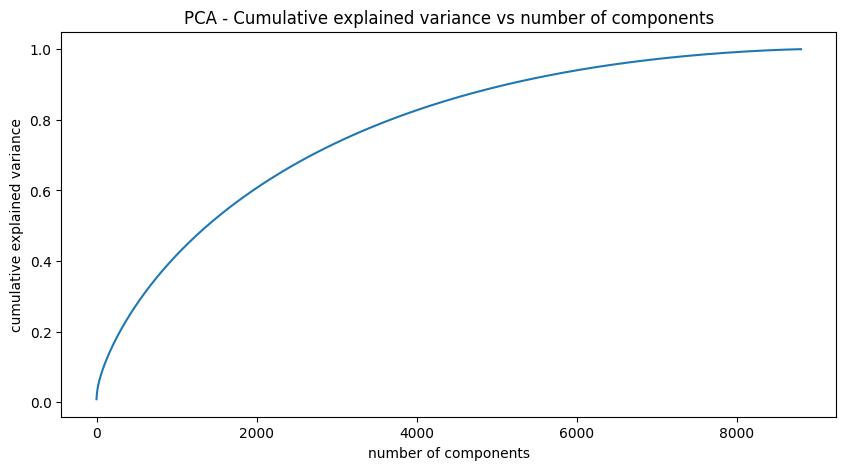

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs number of components')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [ ]:
# reducing the dimensions to 4000 using pca
pca = PCA(n_components=4000,random_state=42)
pca.fit(X)

PCA(n_components=4000, random_state=42)

In [ ]:
# transformed features
x_pca = pca.transform(X)

In [ ]:
# shape of transformed vectors
x_pca.shape

(8807, 4000)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Text(0, 0.5, 'WCSS')

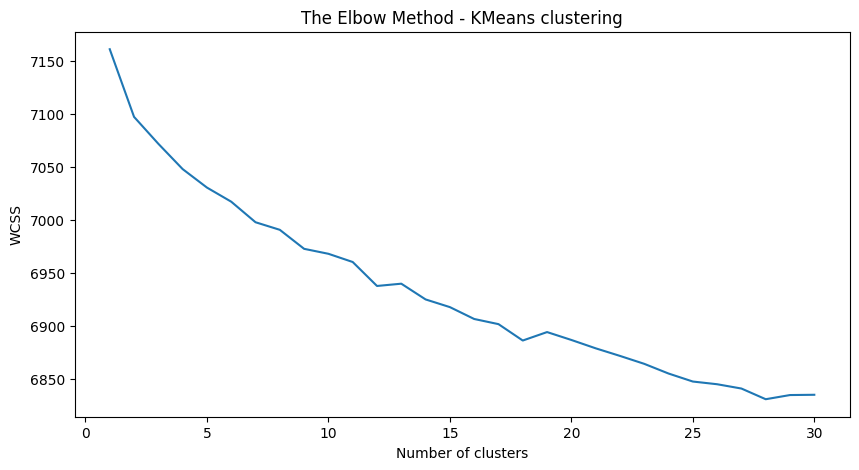

In [ ]:
# Elbow method to find the optimal value of k
wcss=[]
for i in range(1,31):
  kmeans = KMeans(n_clusters=i,init='k-means++',random_state=33)
  kmeans.fit(x_pca)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)

number_clusters = range(1,31)
plt.figure(figsize=(10,5))
plt.plot(number_clusters,wcss)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

In [ ]:
from sklearn.metrics import silhouette_score

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt

silhouette_scores = []

for n_clusters in range(2, 21):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(x_pca)
    silhouette_avg = silhouette_score(x_pca, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Vẽ biểu đồ Silhouette Score theo số lượng cụm
plt.figure(figsize=(10, 6))
plt.plot(range(2, 21), silhouette_scores, marker='o', linestyle='-', color='b')
plt.xlabel('Số lượng cụm')
plt.ylabel('Silhouette Score')
plt.title('Biểu đồ Silhouette Score cho số lượng cụm khác nhau')
plt.xticks(np.arange(2, 21, 1))
plt.grid(True)
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

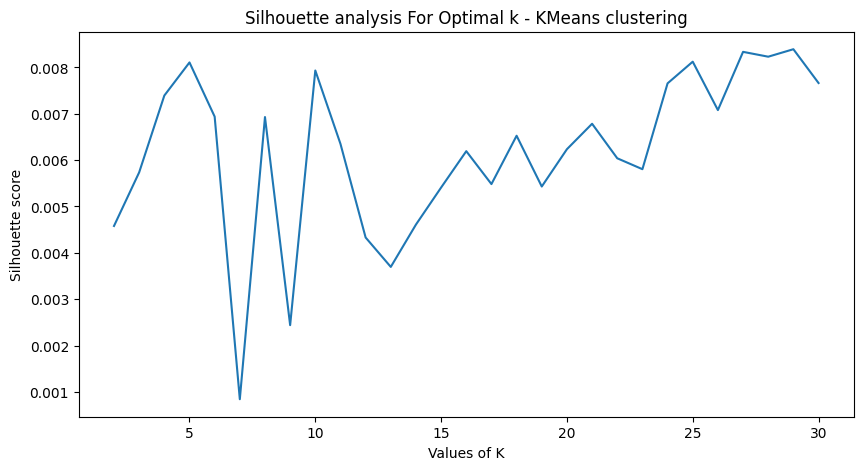

In [ ]:
# Plotting Silhouette score for different umber of clusters
range_n_clusters = range(2,31)
silhouette_avg = []
for num_clusters in range_n_clusters:
  # initialize kmeans
  kmeans = KMeans(n_clusters=num_clusters,init='k-means++',random_state=33)
  kmeans.fit(x_pca)
  cluster_labels = kmeans.labels_

  # silhouette score
  silhouette_avg.append(silhouette_score(x_pca, cluster_labels))

plt.figure(figsize=(10,5))
plt.plot(range_n_clusters,silhouette_avg)
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

In [ ]:
# Clustering the data into 19 clusters
kmeans = KMeans(n_clusters=6,init='k-means++',random_state=33)
kmeans.fit(x_pca)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=6, random_state=33)

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(x_pca, kmeans.labels_)

print((kmeans_distortion,kmeans_silhouette_score))

(7017.08983730034, 0.0069384744964338125)


In [ ]:
# Adding a kmeans cluster number attribute
df1['kmeans_cluster'] = kmeans.labels_

In [ ]:
df1['kmeans_cluster'].describe().T

count    8807.000000
mean        2.921313
std         1.682851
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
max         5.000000
Name: kmeans_cluster, dtype: float64

In [ ]:
import seaborn as sns

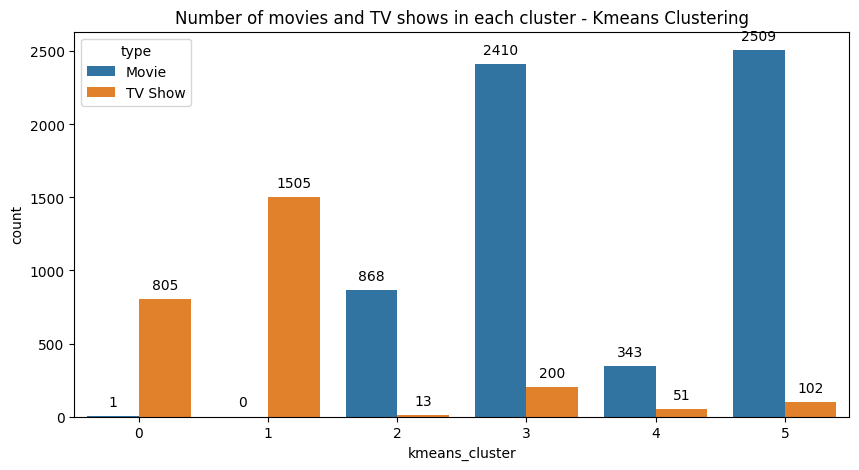

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
q = sns.countplot(x='kmeans_cluster',data=df1, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')
for i in q.patches:
  q.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

In [ ]:
# Building a wordcloud for the movie descriptions
def kmeans_worldcloud(cluster_num):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterate through the csv file
  for val in df1[df1['kmeans_cluster']==cluster_num].description.values:

      # typecaste each val to string
      val = str(val)

      # split the value
      tokens = val.split()

      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()

      comment_words += " ".join(tokens)+" "

  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)


  # plot the WordCloud image
  plt.figure(figsize = (10,5), facecolor = None)
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.tight_layout(pad = 0)

In [ ]:
import re
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
from wordcloud import WordCloud, STOPWORDS

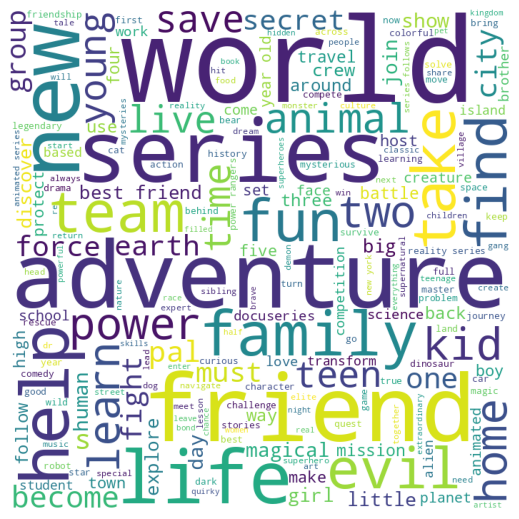

In [ ]:
# Wordcloud for cluster 0
kmeans_worldcloud(0)

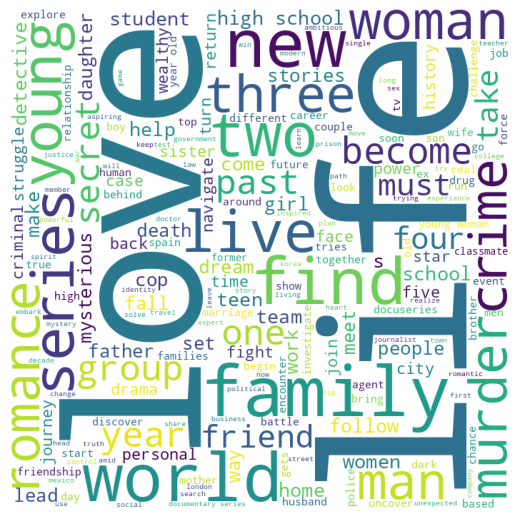

In [ ]:
# Wordcloud for cluster 1
kmeans_worldcloud(1)

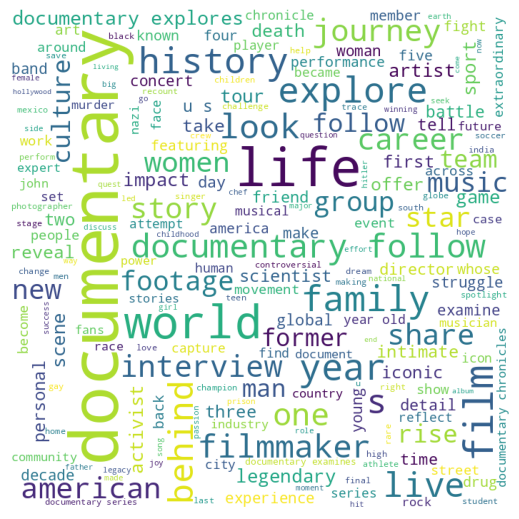

In [ ]:
# Wordcloud for cluster 2
kmeans_worldcloud(2)

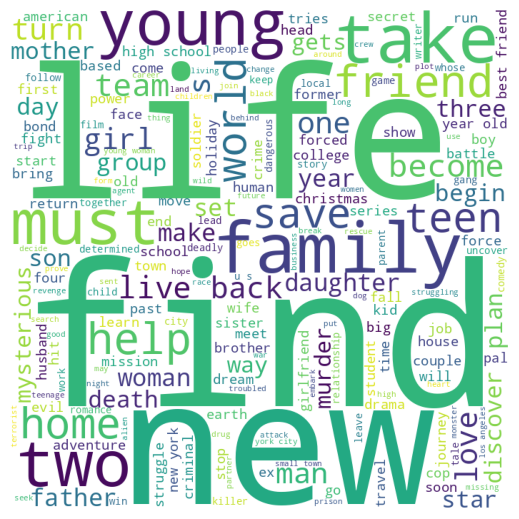

In [ ]:
# Wordcloud for cluster 3
kmeans_worldcloud(3)

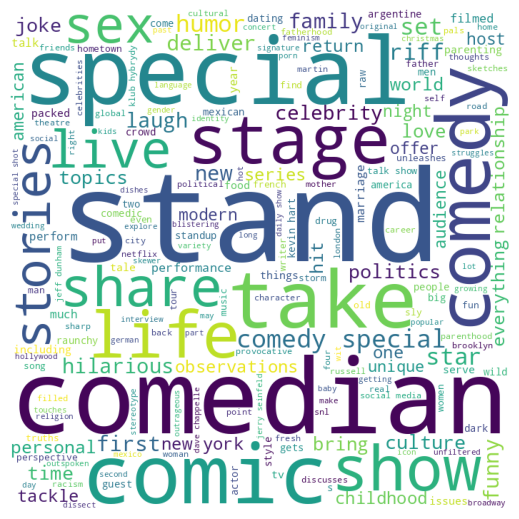

In [ ]:
# Wordcloud for cluster 4
kmeans_worldcloud(4)

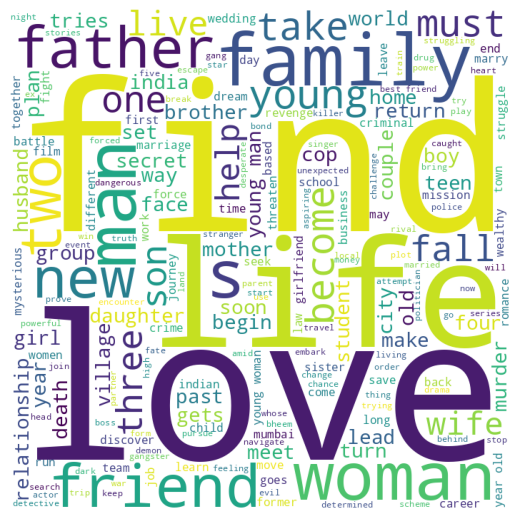

In [ ]:
# Wordcloud for cluster 5
kmeans_worldcloud(5)

In [ ]:
import scipy.cluster.hierarchy as shc

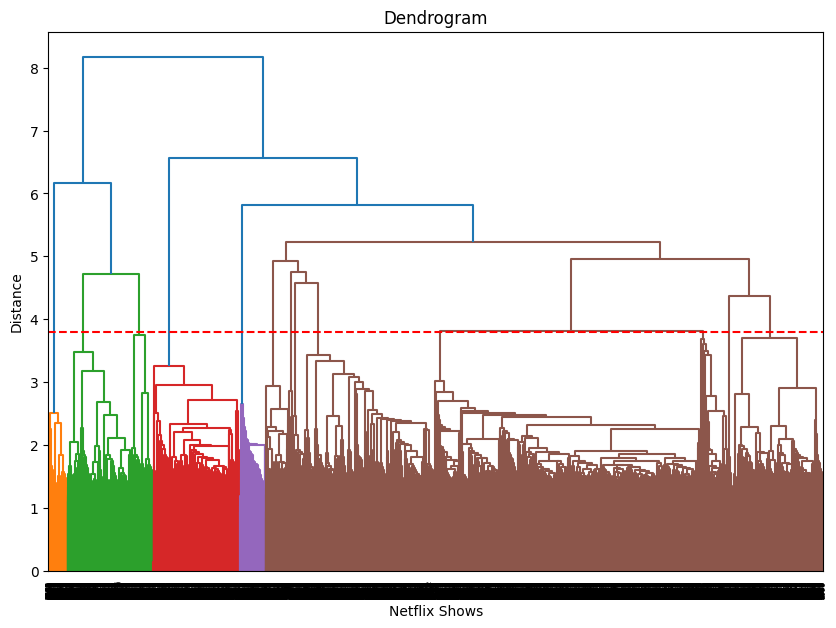

In [ ]:
# Building a dendogram to decide on the number of clusters
plt.figure(figsize=(10, 7))
dend = shc.dendrogram(shc.linkage(x_pca, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 3.8, color='r', linestyle='--')

In [ ]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=12, affinity='euclidean', linkage='ward')
hierarchical.fit_predict(x_pca)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([0, 6, 6, ..., 0, 0, 0])

In [ ]:
# Adding a kmeans cluster number attribute
df1['hierarchical_cluster'] = hierarchical.labels_

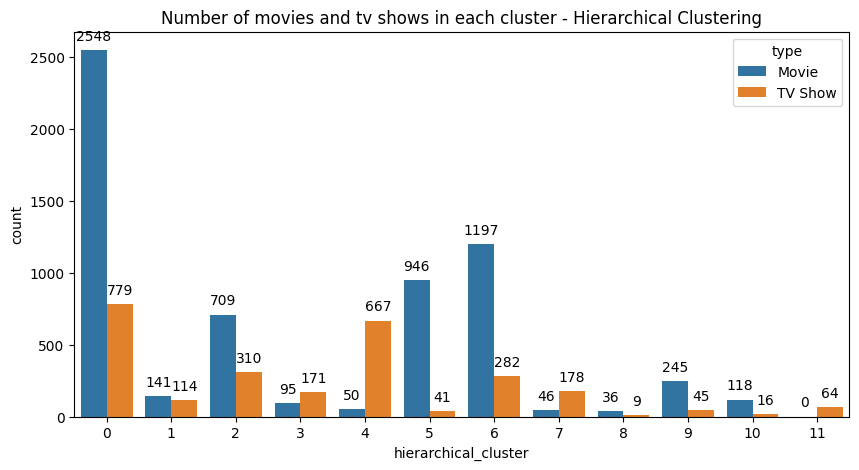

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
q = sns.countplot(x='hierarchical_cluster',data=df1, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')
for i in q.patches:
  q.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

In [ ]:
# Building a wordcloud for the movie descriptions
def hierarchical_worldcloud(cluster_num):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterate through the csv file
  for val in df1[df1['hierarchical_cluster']==cluster_num].description.values:

      # typecaste each val to string
      val = str(val)

      # split the value
      tokens = val.split()

      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()

      comment_words += " ".join(tokens)+" "

  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)


  # plot the WordCloud image
  plt.figure(figsize = (10,5), facecolor = None)
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.tight_layout(pad = 0)

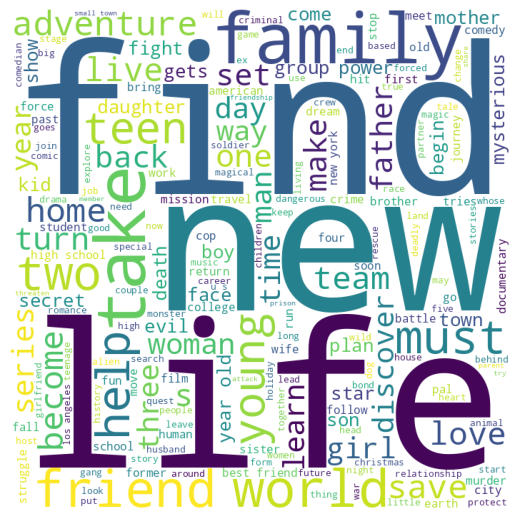

In [ ]:
# Wordcloud for cluster 0
hierarchical_worldcloud(0)

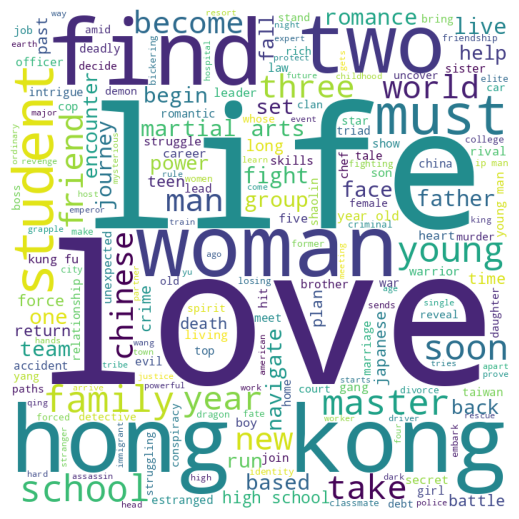

In [ ]:
# Wordcloud for cluster 1
hierarchical_worldcloud(1)

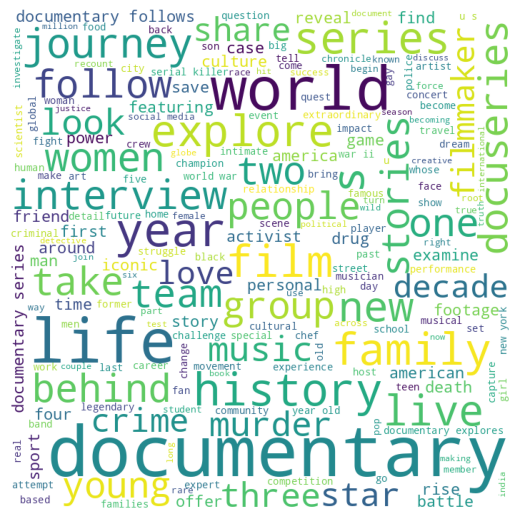

In [ ]:
# Wordcloud for cluster 2
hierarchical_worldcloud(2)

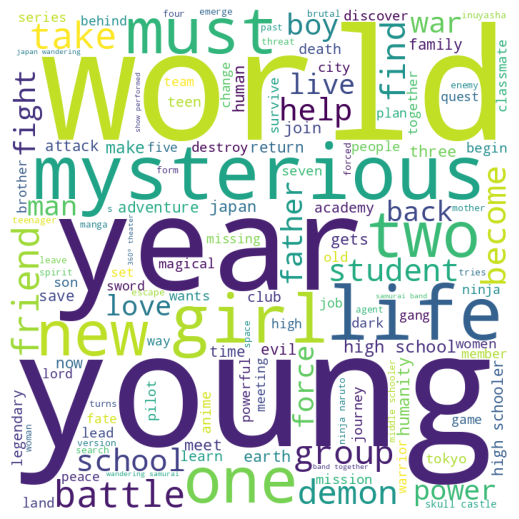

In [ ]:
# Wordcloud for cluster 3
hierarchical_worldcloud(3)

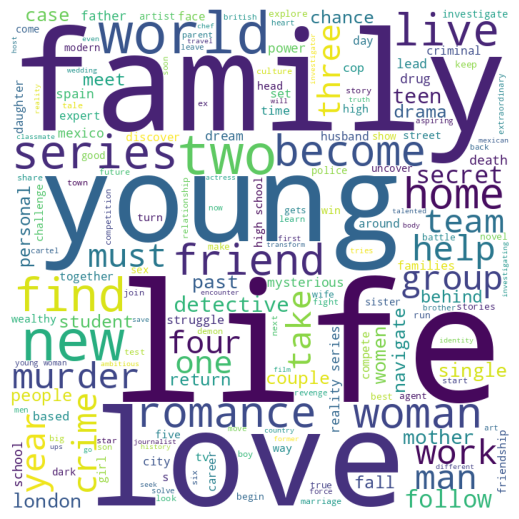

In [ ]:
# Wordcloud for cluster 4
hierarchical_worldcloud(4)

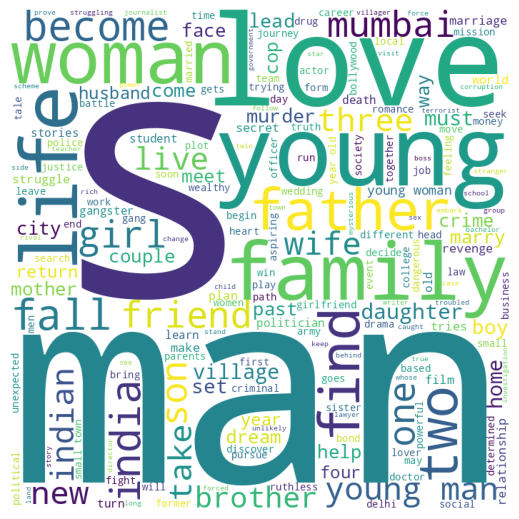

In [ ]:
# Wordcloud for cluster 5
hierarchical_worldcloud(5)

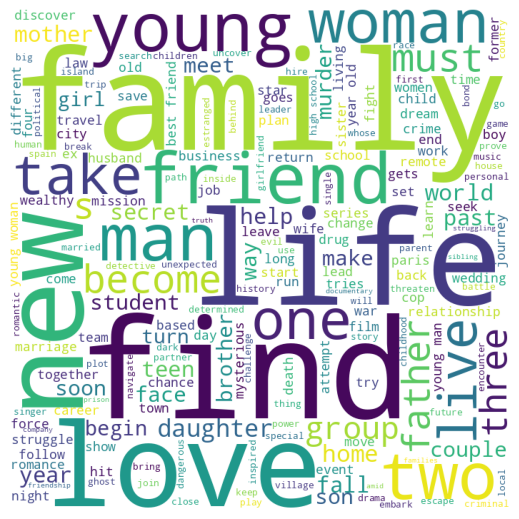

In [ ]:
# Wordcloud for cluster 6
hierarchical_worldcloud(6)

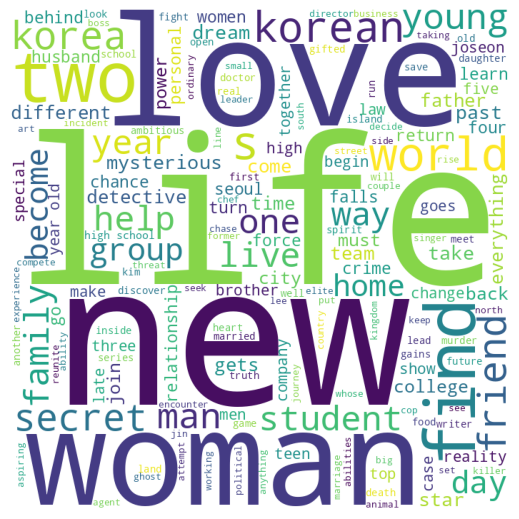

In [ ]:
# Wordcloud for cluster 7
hierarchical_worldcloud(7)

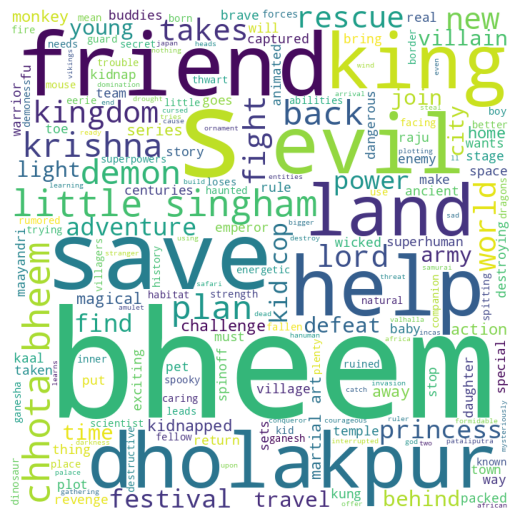

In [ ]:
# Wordcloud for cluster 8
hierarchical_worldcloud(8)

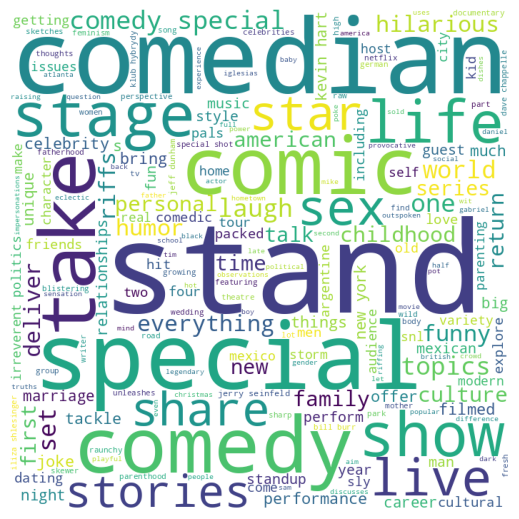

In [ ]:
# Wordcloud for cluster 9
hierarchical_worldcloud(9)

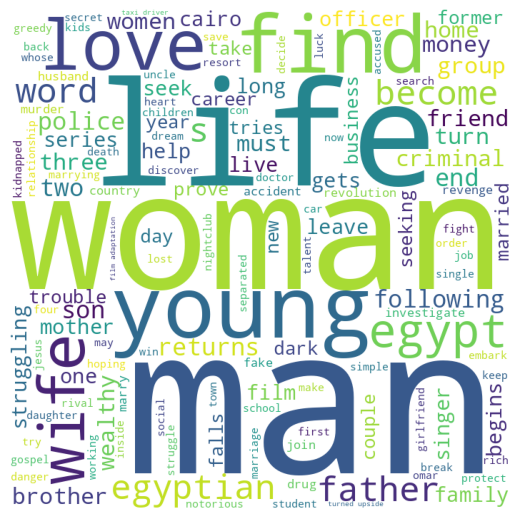

In [ ]:
# Wordcloud for cluster 10
hierarchical_worldcloud(10)

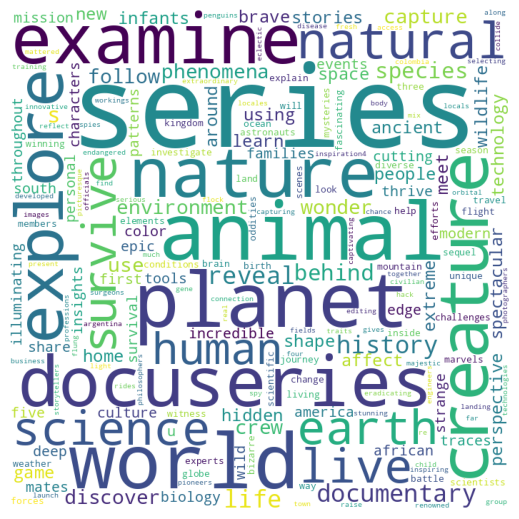

In [ ]:
# Wordcloud for cluster 11
hierarchical_worldcloud(11)